In [1]:
import pandas as pd
import datetime as dt
from functions import calc_dewpoint, calc_thetae, calc_thetav
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import cmocean
import matplotlib.lines as mlines
    
%pylab inline
%config InlineBackend.figure_format='retina'

#sns = pd.read_csv('VSE_Data_1Hz_thermo_distance.csv')
save_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/PubPlots/'

# new storm motions calculated 7 April 2020. Use this from now on
SNSfile = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/ALL_EVENTS_full_thermo_R20km.csv'
sns = pd.read_csv(SNSfile)

sns = sns.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})




Populating the interactive namespace from numpy and matplotlib


In [2]:
from metpy import interpolate

In [ ]:
metpy.plots.

# Contoured Full Domain Plots

In [3]:
from scipy.interpolate import griddata
from matplotlib.dates import date2num, num2date, HourLocator,DateFormatter,MinuteLocator
import cartopy.crs as ccrs 
import cartopy.feature as cfeature
from metpy.plots import USCOUNTIES
from WarningPoly import get_ww_fordate, plot_warnings
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap
import pickle
from collections import OrderedDict
from metpy import  interpolate

# Set up our projection
crs = ccrs.PlateCarree()
globe = ccrs.Globe(datum='WGS84',ellipse='sphere')

# Get data to plot state and province boundaries
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lakes',
        scale='10m',
        facecolor='none')

llcrnrlon=-87.7
llcrnrlat=34.1
urcrnrlon=-85.9
urcrnrlat=35.5

west_lon, east_lon = -87.7, -85.9
north_lat, south_lat=35.55, 34.1

#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())

def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=3, fontsize=12):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    
    edited by Jessie. Found on GitHub - https://github.com/SciTools/cartopy/issues/490
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    # the edge is the black lines in between and extending on the edges of the white and gray parts
    # sbx is the center. length * 500 == half the length
    
    # NOTE: in x-direction, ADDING a value moves it right, SUBTRACTING a value moves it left
    
    edge = 500
    bar_xs = [sbx - length * 500 - edge, sbx + length * 500 +edge]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth+4,solid_capstyle="butt", clip_on=False)  # background
    
    #add colors - 4 colors
    x1, x2, x3, x4, x5 = sbx-length*500, sbx -length*250, sbx, sbx+length*250, sbx+length*500
    ax.plot([x1,x2-edge/2], [sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x2+edge/2,x3-edge/2] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x3+edge/2,x4-edge/2] ,[sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x4+edge/2,x5] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    
    # add "km", center point, and end point
    y_lift = linewidth*10
    ax.text(x3, sby+length*y_lift , str(round(2 * length / 4)), transform=tmc,
                    horizontalalignment='center', verticalalignment='bottom',
                    color='k', fontsize=fontsize)
    ax.text(x5-length*50, sby+length*y_lift , str(round(length)), transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)
    ax.text(x1+length*90, sby+length*y_lift , 'km', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)


Basemap not found. Only import cartopy functions.


### 10 March 2017

In [6]:
event =       sns[sns['date'] == 20170310]
event = event.set_index(event['ID'])
lats =        event['Lats'].values
lons =        event['Lons'].values
te_deficits = np.asarray(event['TE'].values)
tv_deficits = np.asarray(event['TV'].values)
dTVdn =       np.asarray(event['dTVdn'].values)
toas =        pd.to_datetime(event['TOA'].values)

# create time grid
xi,yi = np.linspace(-88.0,-85.75,40),np.linspace(33.96,35.90,40)
X,Y = np.meshgrid(xi,yi)
time_grid= griddata((lons,lats),date2num(toas),(X,Y))

In [7]:
def rgb(hexcol):
    return matplotlib.colors.to_rgba(hexcol)

def plot_options(var):
    '''options include all named variables '''
    
    if var == 'te_deficits':
        mycmap = cmocean.cm.deep_r
        levels = np.arange(-19.5, -7.2, .5)
        clabel = 'K'
        title = r'30-min ${\theta_e}$ Deficits'
          
    elif var == 'tv_deficits':
        mycmap = cmocean.cm.tempo_r
        levels = np.arange(-10, -1.75, .25)
        clabel = 'K'
        title = r'30-min ${\theta_v}$ Deficits'
    
    elif var == 'dTVdn':
        colors = [rgb('#ffffff'),rgb('#aad5e2'),rgb('#3589a5'),rgb('#072f3d')][::-1]
        n_bin = 50
        cmap_name = 'my_list'
        mycmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)
        #mycmap=cmocean.cm.speed_r
        levels = np.arange(-2.1, -0.1, 0.1)
        clabel = r'K km${^{-1}}$'
        title = r'Maximum 3-min ${\theta_v}$ Change'
        
    levels = levels
    cbar_label = clabel
    return mycmap, title, levels, cbar_label
    
    
poly = pickle.load(open('20170310_TorPoly.p', 'rb'))

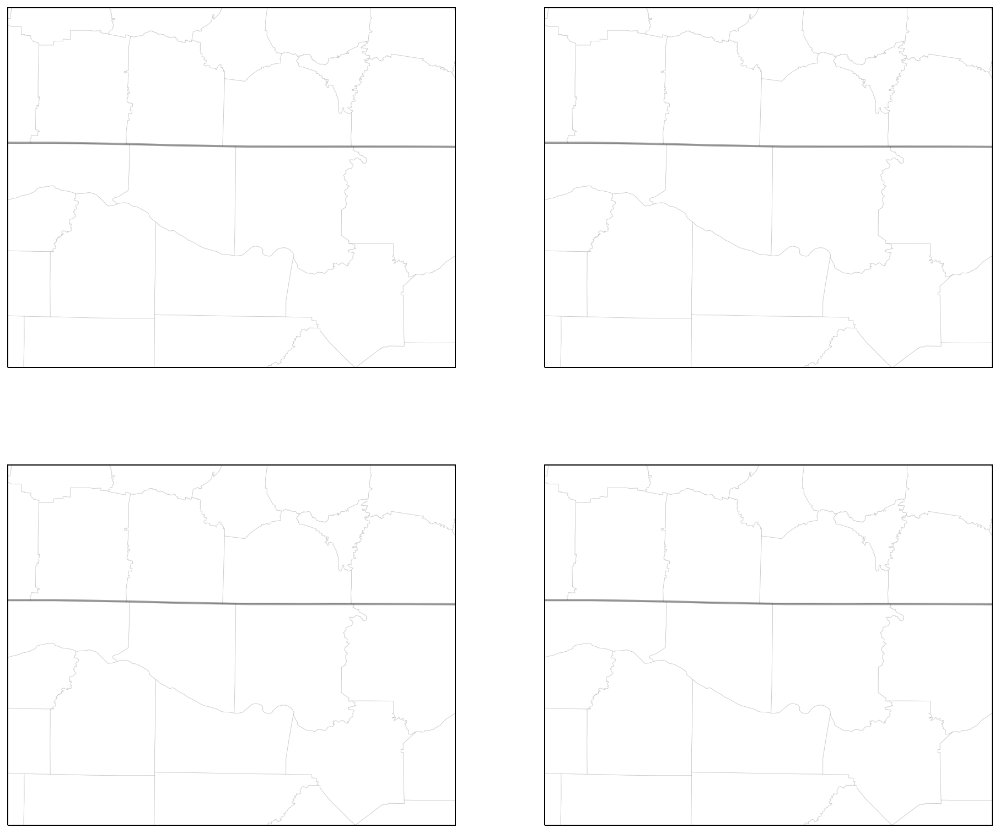

In [12]:
#fig, axes = plt.subplots(2,2, figsize=(16, 14), subplot_kw={'projection': crs})
#fig = plt.figure(1, figsize=(18, 14))
fig, axes = plt.subplots(2,2, figsize=(16, 14), subplot_kw={'projection': crs})
#ax = axes[0]

for ax in axes.flatten():
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    #ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1, linewidth=0.5)
plt.show()

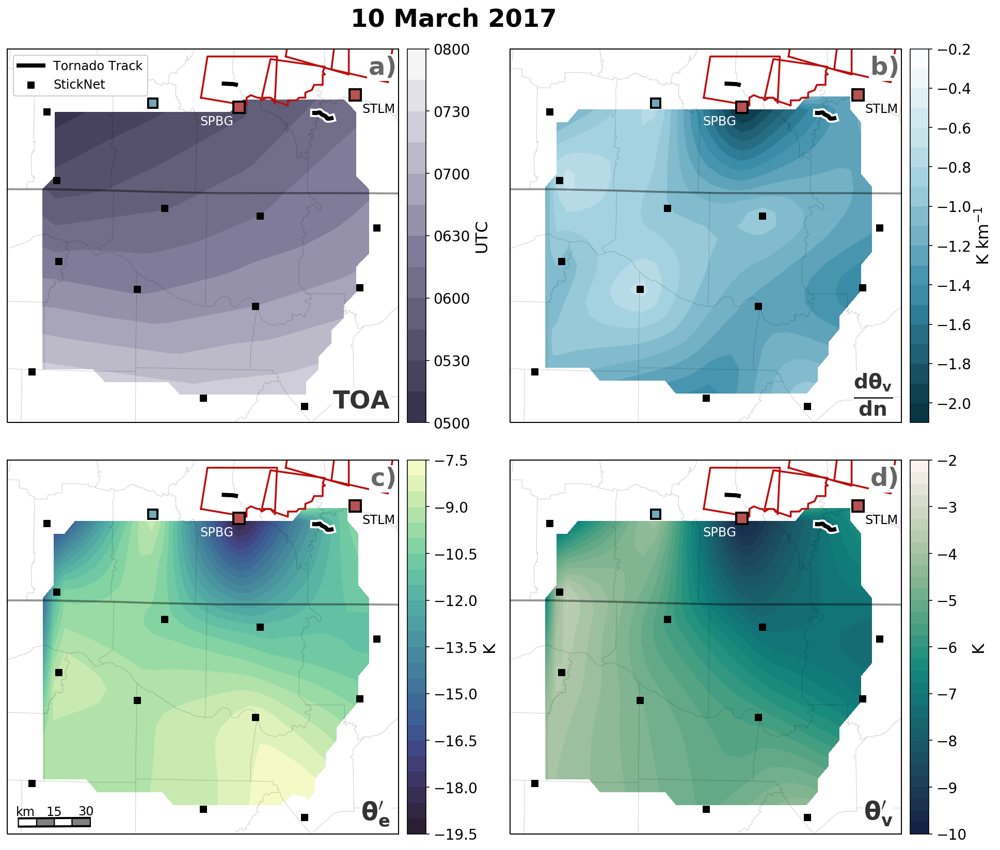

In [24]:
#fig = plt.figure(1, figsize=(18, 14))
fig, axes = plt.subplots(2,2, figsize=(16, 14), subplot_kw={'projection': crs})

for ax in axes.flatten():
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1, linewidth=0.5) # 20m, 5m 500k sizes from large to small
                                                        # use 20m for testing, and 500k for final plots

    ax.scatter(lons, lats, marker='s', color='k', transform=crs, label='StickNet')
    ax.set_aspect('auto')
    plot_warnings(poly, ax, linewidth = 1.8, color='#bc1010', label=None)

    for probe in event.index:
        lon, lat = event.loc[probe]['Lons'],event.loc[probe]['Lats']
        if probe == '0104A':
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 4, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#74a9b8', linewidth=0.0, 
                markersize = 4, markeredgewidth=3)

        if (probe == '0108A') | (probe == '0216A'):
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 6, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#b85151', linewidth=0.0, 
                markersize = 6, markeredgewidth=3)

    # plot tornado tracks
    tortrack = pickle.load(open('20170310_TorTrack.p', 'rb'))
    for track in tortrack.index:
        ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
            color = 'w', linewidth=8)
        ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
            color = 'k', linewidth=4, label='Tornado Track')
#             ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
#                 color = '#b85151', linewidth=2, label='Tor Track')

        

# TIME 
time_levels = date2num(np.arange(dt.datetime(2017,3,10,5), dt.datetime(2017,3,10,8,15), dt.timedelta(minutes=15)))
colors = [rgb('#ffffff'),rgb('#8984a1'), rgb('#312c47')][::-1]
mycmap = LinearSegmentedColormap.from_list('name', colors, N=50)
grid = axes[0,0].contourf(X, Y, time_grid,cmap=mycmap, levels=time_levels)
axes[0,0].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[0,0], fraction=0.046, pad=0.02,
                    format=DateFormatter('%H%M'),ticks=MinuteLocator(interval=30))
cbar.set_label('UTC', fontsize = 16)
cbar.ax.tick_params(labelsize=14)   

handles, labels =ax.get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
axes[0,0].legend(by_label.values(), by_label.keys(),fontsize=12, loc=2, framealpha=1)

# for interpolation and plotting  
gxx = np.arange(np.min(lons), np.max(lons)+0.05, 0.05)
gyy = np.arange(np.min(lats), np.max(lats)+0.05, 0.05)
gx, gy = np.meshgrid(gxx, gyy)
    
# GRAD THETA E
var =dTVdn
mycmap, mytitle, levels, cbar_label = plot_options('dTVdn')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[0,1].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
axes[0,1].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[0,1], fraction=0.046, pad=0.02)
cbar.set_label(cbar_label, fontsize = 16)
cbar.ax.tick_params(labelsize=14)         
             
        
# THETA E
var =te_deficits
mycmap, mytitle, levels, cbar_label = plot_options('te_deficits')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[1,0].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
axes[1,0].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[1,0], fraction=0.046, pad=0.02)
cbar.set_label(cbar_label, fontsize = 16)
cbar.ax.tick_params(labelsize=14) 
scale_bar(axes[1,0], length=30, location=(0.12, 0.03), linewidth=6, fontsize=12)

# THETA V
var =tv_deficits
mycmap, mytitle, levels, cbar_label = plot_options('tv_deficits')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[1,1].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
axes[1,1].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[1,1], fraction=0.046, pad=0.02)
cbar.set_label(cbar_label, fontsize = 16)
cbar.ax.tick_params(labelsize=14)


# add plot type and plot label for publication
plot_labels = ['a)', 'b)', 'c)', 'd)']
plot_types = ['TOA', r'${\mathbf{\frac{d\theta_v}{dn}}}$',r'$\mathbf{\theta_e^{\prime}}$', 
              r'$\mathbf{\theta_v^{\prime}}$']

plat, plon = event.loc['0108A']['Lats'],event.loc['0108A']['Lons']
plat2, plon2 = event.loc['0216A']['Lats'],event.loc['0216A']['Lons']

i=0
for ax in axes.flatten():
    
    # label important SN
    ax.text(plon-0.18, plat-0.07,'SPBG', color='w', fontsize=12)
    ax.text(plon2+.03, plat2-0.07,'STLM', color='k', fontsize=12)
    
    ax.text(-85.91,35.45,plot_labels[i], fontsize=24, color='k', alpha=0.6, weight='bold', ha='right',
           bbox=dict(facecolor='w', edgecolor='w', pad=1))
    if i ==1: # grad tv
        ax.text(-85.94,34.17,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8, 
               bbox=dict(facecolor='w',edgecolor='w', pad=0))
    else:
        ax.text(-85.94,34.155,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold',
               bbox=dict(facecolor='w', edgecolor='w', pad=0))
    i+=1
plt.subplots_adjust(wspace=0.2, hspace=0.1)
plt.suptitle('10 March 2017', fontsize=24,weight='bold', y=0.92)

file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/Pub_Figures/'
plt.savefig('{0}10MarchContouredFourPanel.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

### 30 April 2017

In [25]:
event =       sns[sns['date'] == 20170430]
event =       event.set_index(event['ID'])
lats =        event['Lats'].values
lons =        event['Lons'].values
te_deficits = np.asarray(event['TE'].values)
tv_deficits = np.asarray(event['TV'].values)
dTVdn =       np.asarray(event['dTVdn'].values)
toas =        pd.to_datetime(event['TOA'].values)

# create time grid
xi,yi = np.linspace(-88.0,-85.75,40),np.linspace(33.96,35.90,40)
X,Y = np.meshgrid(xi,yi)
time_grid= griddata((lons,lats),date2num(toas),(X,Y))

In [26]:
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap
import matplotlib
import cmocean

def rgb(hexcol):
    return matplotlib.colors.to_rgba(hexcol)

def plot_options(var):
    '''options include all named variables '''
    
    if var == 'te_deficits':
        mycmap = cmocean.cm.deep_r
        levels = np.arange(-13.5,-4,.5)
        clabel = 'K'
        title = r'10-min ${\theta_e}$ Deficits'
          
    elif var == 'tv_deficits':
        mycmap = cmocean.cm.tempo_r
        levels = np.arange(-8.75,-4.5,0.25)
        clabel = 'K'
        title = r'10-min ${\theta_v}$ Deficits'
        
    elif var == 'dTVdn':
        colors = [rgb('#ffffff'),rgb('#aad5e2'),rgb('#3589a5'),rgb('#072f3d')][::-1]
        n_bin = 50
        cmap_name = 'my_list'
        mycmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)
        levels = np.arange(-2.8,-0.7,.1)
        clabel = r'K km${^{-1}}$'
        title = r'Maximum 3-min ${\theta_v}$ Change'

    return mycmap, title, levels, clabel
poly = pickle.load(open('20170430_TorPoly.p', 'rb'))

In [86]:
np.max(tv_deficits)

-4.75

<Figure size 1296x1008 with 0 Axes>

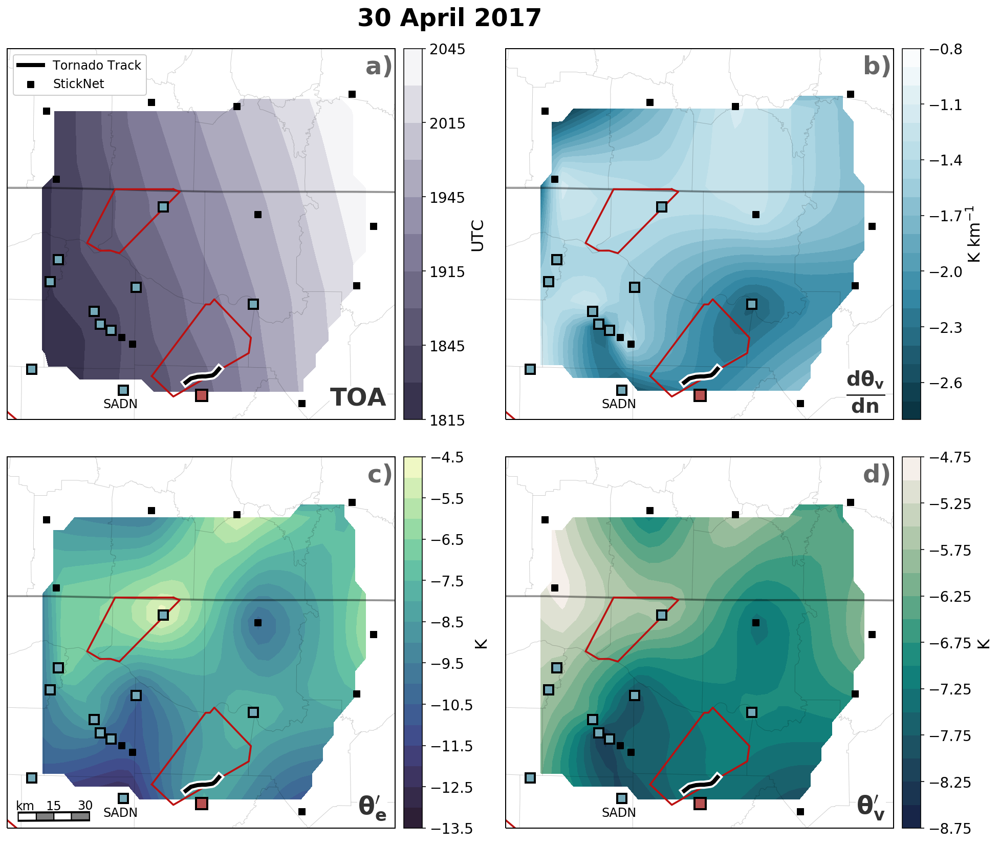

In [27]:
fig = plt.figure(1, figsize=(18, 14))
fig, axes = plt.subplots(2,2, figsize=(16, 14), subplot_kw={'projection': crs})

for ax in axes.flatten():
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1, linewidth=0.5) 
                                                        # 20m, 5m 500k sizes from large to small
                                                        # use 20m for testing, and 500k for final plots

    ax.scatter(lons, lats, marker='s', color='k', transform=crs, label='StickNet')
    ax.set_aspect('auto')
    plot_warnings(poly, ax, linewidth = 1.8, color='#bc1010', label=None)


    for probe in event.index:
        if probe in ['0102A', '0106A', '0214A', '0111A', '0217A','0112A', '0220A','0221A','0222A','0218A']:
            ax.plot(event.loc[probe]['Lons'],event.loc[probe]['Lats'], marker = 's', color = 'k', linewidth=0.0, 
                markersize = 4, markeredgewidth=7)
            ax.plot(event.loc[probe]['Lons'],event.loc[probe]['Lats'], marker = 's', color = '#74a9b8', linewidth=0.0, 
                markersize = 4, markeredgewidth=3)

        if probe == '0107A':
            ax.plot(event.loc[probe]['Lons'],event.loc[probe]['Lats'], marker = 's', color = 'k', linewidth=0.0, 
                markersize = 6, markeredgewidth=7)
            ax.plot(event.loc[probe]['Lons'],event.loc[probe]['Lats'], marker = 's', color = '#b85151', linewidth=0.0, 
                markersize = 6, markeredgewidth=3)

    # plot tornado tracks
    tortrack = pickle.load(open('20170430_TorTrack.p', 'rb'))
    for track in tortrack.index:
        ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
            color = 'w', linewidth=8)
        ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
            color = 'k', linewidth=4, label='Tornado Track')
#             ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
#                 color = '#b85151', linewidth=2, label='Tor Track')
    
        

# TIME 
time_levels = date2num(np.arange(dt.datetime(2017,4,30,18,15), dt.datetime(2017,4,30,21), dt.timedelta(minutes=15)))
colors = [rgb('#ffffff'),rgb('#8984a1'), rgb('#312c47')][::-1]
mycmap = LinearSegmentedColormap.from_list('name', colors, N=50)
grid = axes[0,0].contourf(X, Y, time_grid,cmap=mycmap, levels=time_levels)
axes[0,0].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[0,0], fraction=0.046, pad=0.02,
                    format=DateFormatter('%H%M'),ticks=MinuteLocator(interval=30))
cbar.set_label('UTC', fontsize = 16)
cbar.ax.tick_params(labelsize=14)   

handles, labels =ax.get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
axes[0,0].legend(by_label.values(), by_label.keys(),fontsize=12, loc=2, framealpha=1)

 
gxx = np.arange(np.min(lons), np.max(lons)+0.05, 0.05)
gyy = np.arange(np.min(lats), np.max(lats)+0.05, 0.05)
gx, gy = np.meshgrid(gxx, gyy)
    
# GRAD THETA V
var =dTVdn
mycmap, mytitle, levels, cbar_label = plot_options('dTVdn')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[0,1].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
axes[0,1].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[0,1], fraction=0.046, pad=0.02)
cbar.set_label(cbar_label, fontsize = 16)
cbar.ax.tick_params(labelsize=14)         
             
        
# THETA E
var =te_deficits
mycmap, mytitle, levels, cbar_label = plot_options('te_deficits')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[1,0].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
axes[1,0].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[1,0], fraction=0.046, pad=0.02)
cbar.set_label(cbar_label, fontsize = 16, labelpad=0)
cbar.ax.tick_params(labelsize=14) 
scale_bar(axes[1,0], length=30, location=(0.12, 0.03), linewidth=6, fontsize=12)

# THETA V
var =tv_deficits
mycmap, mytitle, levels, cbar_label = plot_options('tv_deficits')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[1,1].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
axes[1,1].scatter(lons, lats, marker='s', color='k')

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[1,1], fraction=0.046, pad=0.02)
cbar.set_label(cbar_label, fontsize = 16)
cbar.ax.tick_params(labelsize=14)

# add in label for SADN to aid in text discussion
plat, plon = event.loc['0106A']['Lats'],event.loc['0106A']['Lons']
for ax in axes.flatten():
    ax.text(plon-0.095, plat-0.07,'SADN', color='k', fontsize=12)

# add plot type and plot label for publication
plot_labels = ['a)', 'b)', 'c)', 'd)']
plot_types = ['TOA', r'${\mathbf{\frac{d\theta_v}{dn}}}$',r'$\mathbf{\theta_e^{\prime}}$', 
              r'$\mathbf{\theta_v^{\prime}}$']
i=0
for row in axes:
    for ax in row:
        ax.text(-85.91,35.45,plot_labels[i], fontsize=24, color='k', alpha=0.6, weight='bold', ha='right')
        if i ==1: # grad tv
            ax.text(-85.94,34.17,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8,
                   bbox=dict(facecolor='w',edgecolor='w', pad=0))
        else:
            ax.text(-85.94,34.155,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold',
                   bbox=dict(facecolor='w', edgecolor='w', pad=0))
        i+=1           
            
plt.subplots_adjust(wspace=0.2, hspace=0.1)

plt.suptitle('30 April 2017', fontsize=24,weight='bold', y=0.92)
plt.savefig('{0}30AprilContouredFourPanel.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

# normalized plots

In [16]:
import matplotlib.patheffects as path_effects

def get_1hz(date, probe, starttime, duration, seconds=False):
    directory= '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/data_1s/'
    datafile = "{}{}_{}.csv".format(directory, probe, date)
    data = pd.read_csv(datafile, header=0, index_col = 'time', parse_dates=['time'], date_parser=pd.to_datetime)
    
    if seconds == False:
        # handle when data from two days is needed
        s = (starttime-dt.timedelta(minutes=1))
        e = (starttime+dt.timedelta(minutes=duration))
        if s.strftime('%d')!= e.strftime('%d'):
            datafile = "{}{}_{}.csv".format(directory, probe, e.strftime('%Y%m%d'))
            data2 = pd.read_csv(datafile, header=0, index_col = 'time', parse_dates=['time'], date_parser=pd.to_datetime)
            data = pd.concat([data.iloc[0:-1],data2])

        return data[starttime:starttime+dt.timedelta(minutes=duration)]
    if seconds == True:
        # handle when data from two days is needed
        s = (starttime-dt.timedelta(minutes=1))
        e = (starttime+dt.timedelta(seconds=duration))
        if s.strftime('%d')!= e.strftime('%d'):
            datafile = "{}{}_{}.csv".format(directory, probe, e.strftime('%Y%m%d'))
            data2 = pd.read_csv(datafile, header=0, index_col = 'time', parse_dates=['time'], date_parser=pd.to_datetime)
            data = pd.concat([data.iloc[0:-1],data2])

        return data[starttime:starttime+dt.timedelta(seconds=duration)]

def plot_norm(ax, probe_id, TOA, duration, legend=False, y2_supress=False, text_c = '#6f7070', skip=1):
    
    # format axis and set up times
    ax.xaxis_date()
    
    ax_wd = ax.twinx()
    ax_wd.set_zorder(0)
    ax.set_zorder(1)
    ax.patch.set_visible(False)
    # Set axtwin's patch visible and colorize it in grey
    ax_wd.patch.set_visible(True)
    
    TOA = pd.to_datetime(TOA)
    starttime = TOA - dt.timedelta(minutes=duration/2)
    endtime = TOA - dt.timedelta(minutes=duration/2)
    
    # pull data
    met = get_1hz(TOA.strftime('%Y%m%d'),probe_id, starttime, duration)[::skip]

    # calculate variables
    dewp = calc_dewpoint(met['T'], met['RH'])
    mslp = met['P'] #calc_mslp(met['T'] ,met['P'], elevation)
    thetae = calc_thetae(met['T'], dewp, met['P'])
    thetav = calc_thetav(met['T'], dewp, met['P'])
    ws = met['WS']
    wd = met['WD'] 
    
    ### fix for 104A 20170310
    if (TOA.strftime('%Y%m%d') == '20170310') & (probe_id == '0104A'):
        mslp[mslp == mslp.max()] = np.nan  # drop the one wrong data point
        mslp[mslp == mslp.max()] = np.nan
        
    ### fix for 222A 20170420
    if (TOA.strftime('%Y%m%d') == '20170430') & (probe_id == '0222A'):
        thetae[thetae == thetae.min()] = np.nan  # drop the one wrong data point
        thetav[thetav == thetav.min()] = np.nan
    
    # normalize variables
    n_mslp =     mslp.apply(lambda x:(x - np.min(mslp))  / (np.max(mslp)   - np.min(mslp)))
    n_thetae = thetae.apply(lambda x:(x - np.min(thetae))/ (np.max(thetae) - np.min(thetae)))
    n_thetav = thetav.apply(lambda x:(x - np.min(thetav))/ (np.max(thetav) - np.min(thetav)))
    n_ws =         ws.apply(lambda x:(x - np.min(ws))    / (np.max(ws)     - np.min(ws)))
    
    
     
    # plot variables
    # choclate
    tv_color = '#315969' #'#0057b3'
    
    
    ax.plot(met.index,n_ws, color = 'C1', linestyle = '-', linewidth = 1, label = 'Wind Spd', alpha=0.5)     
    ax.plot(met.index,n_mslp, color = 'dimgray', linewidth = 1.5, label = r'MSLP')
    ax.plot(met.index,n_thetae, color = 'C2', linewidth = 2., label = r'$\theta_e$') 
    ax.plot(met.index,n_thetav, color = tv_color,  linewidth = 2., label = r'$\theta_v$')
    
    # plot wind direction, which can't be normalized
    wd_c = 'C3'#'#a34141'
    ax_wd.scatter(met.index, wd, color=wd_c ,s=(2.5*2), label = 'Wind Dir', zorder=0, alpha=0.5)
    ax_wd.set_ylim(0,360)
    ax_wd.tick_params(axis='y',labelsize=12, colors = wd_c )
    ax_wd.set_ylabel('Wind Direction (Deg)', fontsize=14, color=wd_c )
    if y2_supress: # supress y ticks for left hand plots
        ax_wd.set_yticks([])
        ax_wd.set_ylabel('', fontsize=14, color='C3')

    
    # legend
    if legend:
        lines,labels = ax.get_legend_handles_labels()
        lines2,labels2 = ax_wd.get_legend_handles_labels()
        ax.legend(lines+lines2,labels+labels2,  loc=8, fontsize=13,
                  ncol=5,handletextpad=0.1,markerscale=1, columnspacing=0.5, numpoints=2, framealpha=1)

    #l plot details
    ax.grid()
    ax.set_ylim(-0.19, 1.19)
    
    # plot StickNet Id in upper left corner
    try:
        if np.isnan(event.loc[probe_id]['N_ID']) == True:
            ax.text(0.04,0.9,event.loc[probe_id]['ID'], fontsize=20, transform=ax.transAxes,color=text_c,
                   weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8)) #probe_locs[probe_id][3]
    except:
        ax.text(0.04,0.9,event.loc[probe_id]['N_ID'], fontsize=20, transform=ax.transAxes,color=text_c,
               weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

    # rotate x ticks
    fig.canvas.draw()
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=20.0)
    
def plot_norm(ax, probe_id, TOA, duration, legend=False, y2_supress=False, text_c = '#6f7070', skip=1):
    
    # format axis and set up times
    ax.xaxis_date()
    
    ax_wd = ax.twinx()
    ax_wd.set_zorder(0)
    ax.set_zorder(1)
    ax.patch.set_visible(False)
    # Set axtwin's patch visible and colorize it in grey
    ax_wd.patch.set_visible(True)
    
    TOA = pd.to_datetime(TOA)
    starttime = TOA - dt.timedelta(minutes=duration/2)
    endtime = TOA - dt.timedelta(minutes=duration/2)
    
    # pull data
    met = get_1hz(TOA.strftime('%Y%m%d'),probe_id, starttime, duration)[::skip]

    # calculate variables
    dewp = calc_dewpoint(met['T'], met['RH'])
    mslp = met['P'] #calc_mslp(met['T'] ,met['P'], elevation)
    thetae = calc_thetae(met['T'], dewp, met['P'])
    thetav = calc_thetav(met['T'], dewp, met['P'])
    ws = met['WS']
    wd = met['WD'] 
    
    
    ### fix for 104A 20170310
    if (TOA.strftime('%Y%m%d') == '20170310') & (probe_id == '0104A'):
        mslp[mslp == mslp.max()] = np.nan  # drop the one wrong data point
        mslp[mslp == mslp.max()] = np.nan
        
    ### fix for 222A 20170420
    if (TOA.strftime('%Y%m%d') == '20170430') & (probe_id == '0222A'):
        thetae[thetae == thetae.min()] = np.nan  # drop the one wrong data point
        thetav[thetav == thetav.min()] = np.nan
    
    # normalize variables
    n_mslp =     mslp.apply(lambda x:(x - np.min(mslp))  / (np.max(mslp)   - np.min(mslp)))
    n_thetae = thetae.apply(lambda x:(x - np.min(thetae))/ (np.max(thetae) - np.min(thetae)))
    n_thetav = thetav.apply(lambda x:(x - np.min(thetav))/ (np.max(thetav) - np.min(thetav)))
    n_ws =         ws.apply(lambda x:(x - np.min(ws))    / (np.max(ws)     - np.min(ws)))
    
    
     
    ax.axvline(TOA, color='C0', alpha=0.5, linewidth=2.5, linestyle=':', label='TOA')
    
    # plot variables
    # choclate
    tv_color = '#30749c'#'#3d6473'#'#315969' #'#0057b3'
    te_color = '#67b05b'#'#72a66a'#'#709e7c'
    ws_color = "C1"
    wd_color = 'C3'
    mslp_color="#706464"
    
    pe1 = [path_effects.Stroke(linewidth=2.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    pe2 = [path_effects.Stroke(linewidth=3.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    
    ax.plot(met.index,n_thetae, color = te_color, linewidth = 2, label = r'$\theta_e$', alpha=0.7,
           path_effects=pe1, zorder=29)
    ax.plot(met.index,n_thetav, color = tv_color,  linewidth = 3, label = r'$\theta_v$', alpha=0.85,
           path_effects=pe2, zorder=30)
    
    ax.plot(met.index,n_mslp, color = mslp_color, alpha=0.3, linewidth = 3, label = r'MSLP') #0.3
    ax.plot(met.index,n_ws, color = ws_color, linestyle = '-', linewidth = 3, label = 'Wind Spd', alpha=0.2) #0.2    
    
    
   
   
    
    
    # plot wind direction, which can't be normalized
    wd_c = 'C3'#'#a34141'
    ax_wd.scatter(met.index, wd, marker='o', color=wd_color,s=(8*2), label = 'Wind Dir', zorder=0, alpha=0.4,
                 linewidth=0)
    ax_wd.set_ylim(0,360)
    ax_wd.tick_params(axis='y',labelsize=12, colors = wd_color )
    ax_wd.set_ylabel('Wind Direction (Deg)', fontsize=14, color=wd_color , weight='bold', labelpad=8)
    if y2_supress: # supress y ticks for left hand plots
        ax_wd.set_yticks([])
        ax_wd.set_ylabel('', fontsize=14, color='C3')
        
    

    
    # legend
    if legend:
        lines,labels = ax.get_legend_handles_labels()
        lines2,labels2 = ax_wd.get_legend_handles_labels()
        ax.legend(lines+lines2,labels+labels2,  loc=8, fontsize=12,
                  ncol=6,handletextpad=0.1,markerscale=1, columnspacing=0.5, numpoints=2, framealpha=1)

    #l plot details
    #ax.grid(linestyle=':')
    ax.set_ylim(-0.19, 1.19)
    
    # plot StickNet Id in upper left corner
    try:
        if np.isnan(event.loc[probe_id]['N_ID']) == True:
            ax.text(0.04,0.9,event.loc[probe_id]['ID'], fontsize=20, transform=ax.transAxes,color=text_c,
                   weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8)) #probe_locs[probe_id][3]
    except:
        ax.text(0.04,0.9,event.loc[probe_id]['N_ID'], fontsize=20, transform=ax.transAxes,color=text_c,
               weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

    # rotate x ticks
    fig.canvas.draw()
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=20.0)

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel_launcher.py:149: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


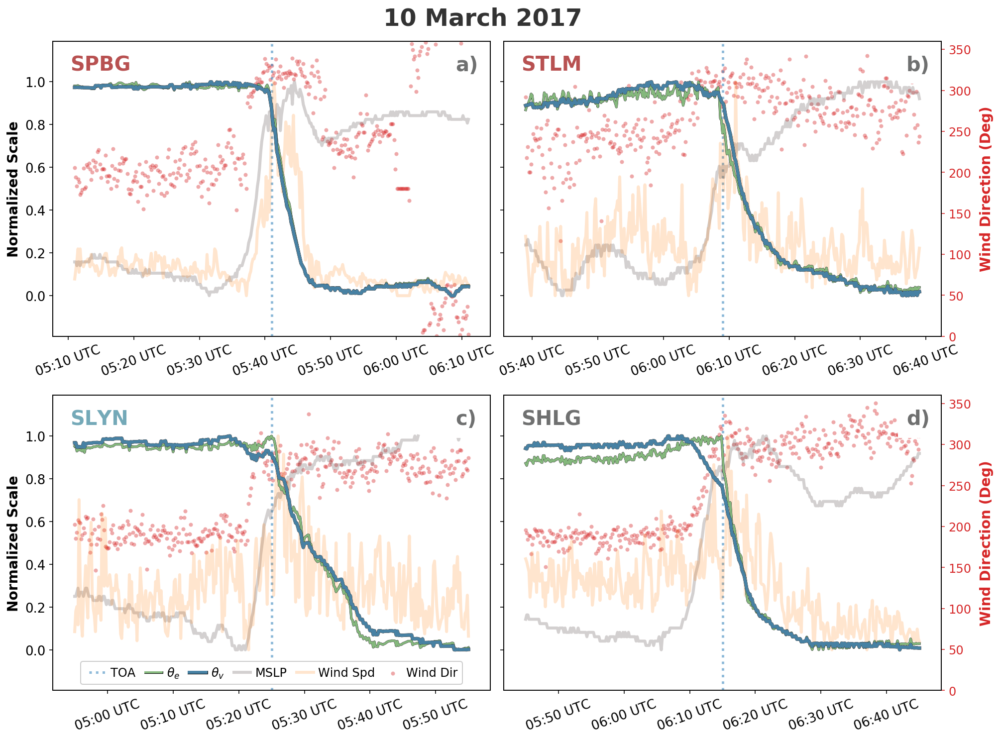

In [23]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,12),sharey= True)

event = sns[sns['date']==20170310]
event = event.set_index(event['ID'])
SN = ['0108A','0216A','0104A','0213A']
#plot_label = ['a.)', 'b.)', 'c.)', 'd.)']
duration = 60

tor = '#b85151'
rot = '#74a9b8'
iskip = 10

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=tor, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=tor, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, skip=iskip)

# force axes to not be butts

plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.90,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03)
plt.suptitle('10 March 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)
axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
plt.savefig('{0}10MarchNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

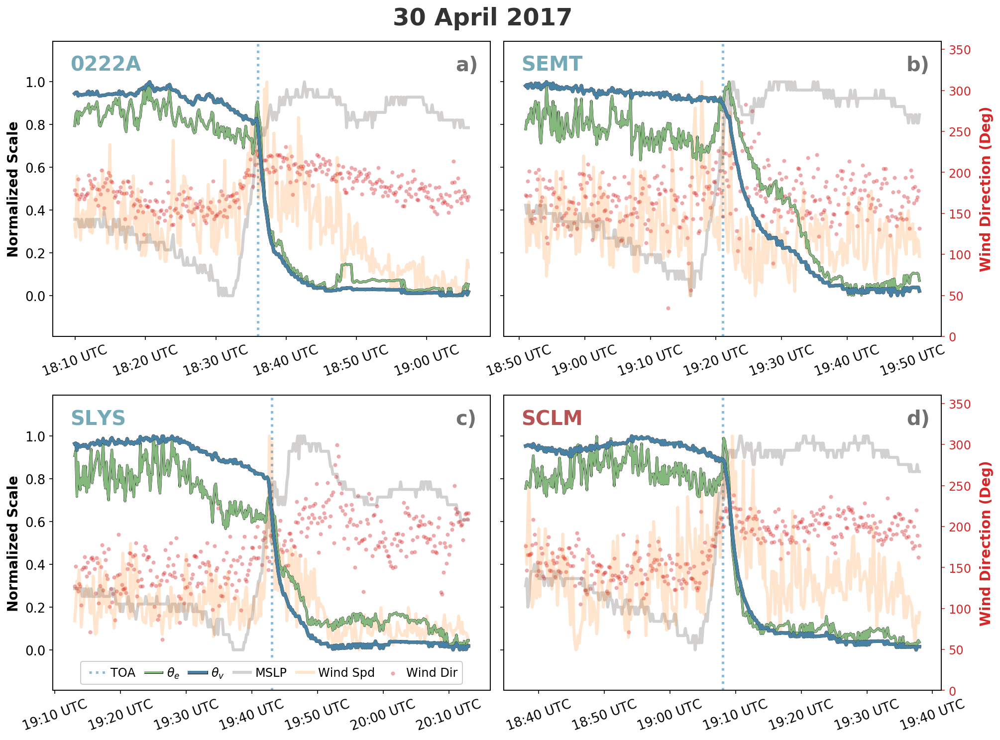

In [25]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,12),sharey= True)

event = sns[sns['date']==20170430]
event = event.set_index(event['ID'])
SN = ['0222A','0214A','0111A','0107A']


duration = 60

tor = '#b85151'
rot = '#74a9b8'
iskip=10

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=rot, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=rot, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, text_c = tor, skip=iskip)

# force axes to not be butts
plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.9,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)

axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
plt.savefig('{0}30AprilNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

In [17]:
def find_nearest(array, value):
    array = np.asarray(array)
    return (np.abs(array-value)).argmin()

def get_correction_angle(u, v, ref):
    theta_motion = np.rad2deg(np.arctan(v/u))
    if (theta_motion < 0) & (ref < 0):
        theta_correction = np.deg2rad(abs(ref) - abs(theta_motion)) 
    else:
        theta_correction = np.deg2rad(abs(ref - theta_motion))
  
    return theta_correction

def plot_norm(ax, probe_id, TOA, duration, legend=False, y2_supress=False, text_c = '#6f7070', skip=1):
    
    # format axis and set up times
    #ax.xaxis_date()
    
    ax_wd = ax.twinx()
    ax_wd.set_zorder(0)
    ax.set_zorder(1)
    ax.patch.set_visible(False)
    # Set axtwin's patch visible and colorize it in grey
    ax_wd.patch.set_visible(True)
    
    TOA = pd.to_datetime(TOA)
    starttime = TOA - dt.timedelta(minutes=duration/2)
    endtime = TOA - dt.timedelta(minutes=duration/2)
    
    # pull data
    met = get_1hz(TOA.strftime('%Y%m%d'),probe_id, starttime, duration)[::skip]
    
    SNdata = event.loc[probe_id]
    u = SNdata['Ua']
    v = SNdata['Va']
    ref = SNdata['storm_ref_angle']
    storm_speed = np.sqrt(u**2 + v**2)
    
    delta_time = (met.index[:]-met.index[0]).seconds
    dist = (storm_speed * delta_time)/1000
    
#     theta_c = get_correction_angle(u,v,ref)
#     dist = dist * np.cos(theta_c)

    # center new_dist on TOA, negative values are before TOA, postive are after
    for i,ind in enumerate(met.index):
        rounded = ind.replace(second=0)
        if rounded == TOA:
            toa_idx = i
            break
    dist = dist - dist[toa_idx]
    
    distance = 20
    start = find_nearest(dist, -1*distance)
    end = find_nearest(dist, distance)
    dist = dist[start:end]
    met = met.iloc[start:end]
    
    dist = -1*dist

    # calculate variables
    dewp = calc_dewpoint(met['T'], met['RH'])
    mslp = met['P'] #calc_mslp(met['T'] ,met['P'], elevation)
    thetae = calc_thetae(met['T'], dewp, met['P'])
    thetav = calc_thetav(met['T'], dewp, met['P'])
    ws = met['WS']
    wd = met['WD'] 
    
    
    ### fix for 104A 20170310
    if (TOA.strftime('%Y%m%d') == '20170310') & (probe_id == '0104A'):
        mslp[mslp == mslp.max()] = np.nan  # drop the one wrong data point
        mslp[mslp == mslp.max()] = np.nan
        
    ### fix for 222A 20170420
    if (TOA.strftime('%Y%m%d') == '20170430') & (probe_id == '0222A'):
        thetae[thetae == thetae.min()] = np.nan  # drop the one wrong data point
        thetav[thetav == thetav.min()] = np.nan
    
    # normalize variables
    n_mslp =     mslp.apply(lambda x:(x - np.min(mslp))  / (np.max(mslp)   - np.min(mslp)))
    n_thetae = thetae.apply(lambda x:(x - np.min(thetae))/ (np.max(thetae) - np.min(thetae)))
    n_thetav = thetav.apply(lambda x:(x - np.min(thetav))/ (np.max(thetav) - np.min(thetav)))
    n_ws =         ws.apply(lambda x:(x - np.min(ws))    / (np.max(ws)     - np.min(ws)))
    
    
     
    ax.axvline(0, color='C0', alpha=0.5, linewidth=2.5, linestyle=':')
    
    # plot variables
    # choclate
    tv_color = '#30749c'#'#3d6473'#'#315969' #'#0057b3'
    te_color = '#67b05b'#'#72a66a'#'#709e7c'
    ws_color = "C1"
    wd_color = 'C3'
    mslp_color="#706464"
    
    pe1 = [path_effects.Stroke(linewidth=2.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    pe2 = [path_effects.Stroke(linewidth=3.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    
    ax.plot(dist,n_thetae, color = te_color, linewidth = 2, label = r'$\theta_e$', alpha=0.7,
           path_effects=pe1, zorder=29)
    ax.plot(dist,n_thetav, color = tv_color,  linewidth = 3, label = r'$\theta_v$', alpha=0.85,
           path_effects=pe2, zorder=30)
    
    ax.plot(dist,n_mslp, color = mslp_color, alpha=0.3, linewidth = 3, label = r'MSLP') #0.3
    ax.plot(dist,n_ws, color = ws_color, linestyle = '-', linewidth = 3, label = 'Wind Spd', alpha=0.2) #0.2    
    
    
    
    # plot wind direction, which can't be normalized
    wd_c = 'C3'#'#a34141'
    ax_wd.scatter(dist, wd, marker='o', color=wd_color,s=(8*2), label = 'Wind Dir', zorder=0, alpha=0.4,
                 linewidth=0)
    ax_wd.set_ylim(0,360)
    ax_wd.tick_params(axis='y',labelsize=12, colors = wd_color )
    ax_wd.set_ylabel('Wind Direction (Deg)', fontsize=14, color=wd_color , weight='bold', labelpad=8)
    if y2_supress: # supress y ticks for left hand plots
        ax_wd.set_yticks([])
        ax_wd.set_ylabel('', fontsize=14, color='C3')
        
    

    
    # legend
    if legend:
        lines,labels = ax.get_legend_handles_labels()
        lines2,labels2 = ax_wd.get_legend_handles_labels()
        ax.legend(lines+lines2,labels+labels2,  loc=8, fontsize=12,
                  ncol=6,handletextpad=0.1,markerscale=1, columnspacing=0.5, numpoints=2, framealpha=1)

    #l plot details
    #ax.grid(linestyle=':')
    ax.set_ylim(-0.19, 1.19)
    
    # plot StickNet Id in upper left corner
    try:
        if np.isnan(event.loc[probe_id]['N_ID']) == True:
            ax.text(0.04,0.9,event.loc[probe_id]['ID'], fontsize=20, transform=ax.transAxes,color=text_c,
                   weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8)) #probe_locs[probe_id][3]
    except:
        ax.text(0.04,0.9,event.loc[probe_id]['N_ID'], fontsize=20, transform=ax.transAxes,color=text_c,
               weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

    # rotate x ticks
#     fig.canvas.draw()
#     labels = ax.get_xticklabels()
#     ax.set_xticklabels(labels, rotation=20.0)
    
    #ax.invert_xaxis()
    ax.grid(linestyle=':')

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel_launcher.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


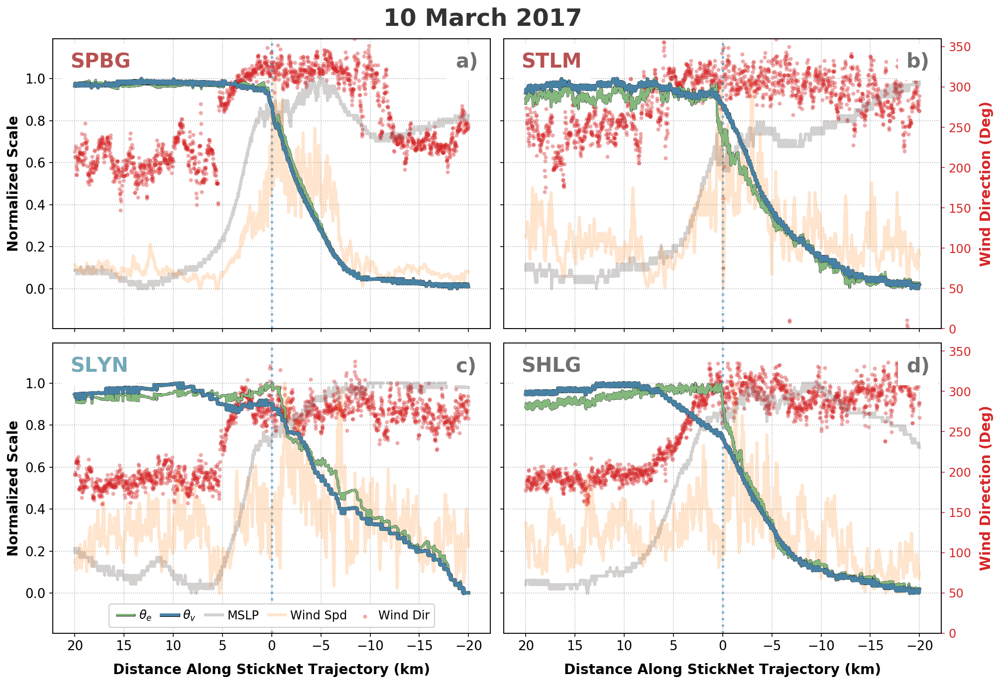

In [19]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,11),sharey= True, sharex=True)
axes[0,0].invert_xaxis()

event = sns[sns['date']==20170310]
event = event.set_index(event['ID'])
SN = ['0108A','0216A','0104A','0213A']
#plot_label = ['a.)', 'b.)', 'c.)', 'd.)']
duration = 120

tor = '#b85151'
rot = '#74a9b8'
iskip = 1

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=tor, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=tor, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, skip=iskip)

# force axes to not be butts

plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    #ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.90,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03, hspace=0.05)
plt.suptitle('10 March 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)
axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')

axes[1,0].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);
axes[1,1].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);


#plt.savefig('{0}10MarchNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

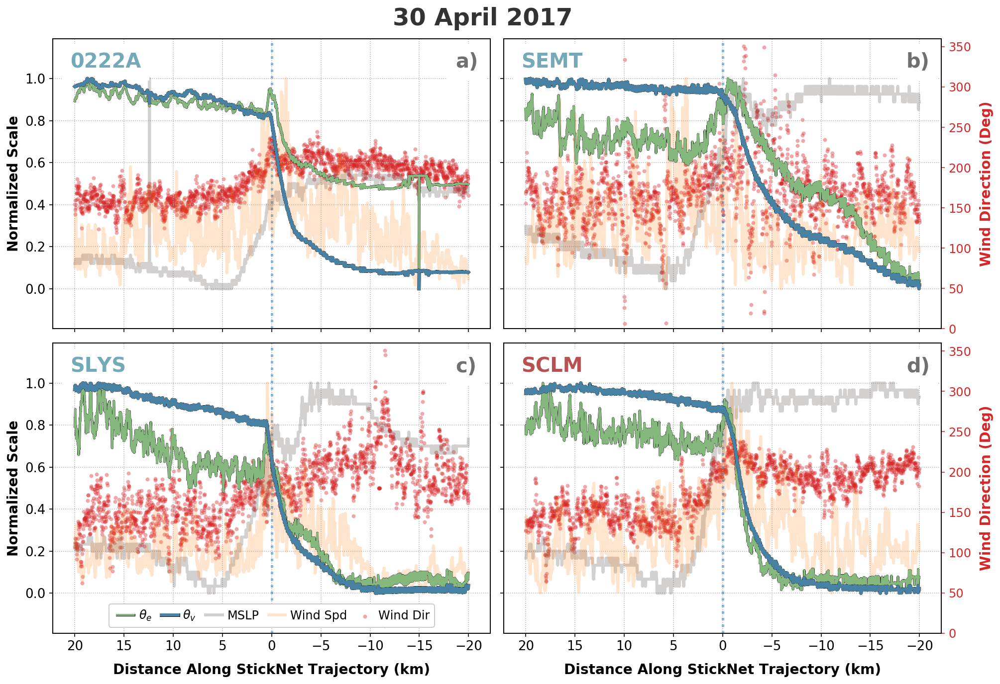

In [21]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,11),sharey= True, sharex=True)
axes[0,0].invert_xaxis()

event = sns[sns['date']==20170430]
event = event.set_index(event['ID'])
SN = ['0222A','0214A','0111A','0107A']


duration = 120

tor = '#b85151'
rot = '#74a9b8'
iskip=1#0

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=rot, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=rot, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, text_c = tor, skip=iskip)

# force axes to not be butts
plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    #ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.9,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03, hspace=0.05)
plt.suptitle('30 April 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)

axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')

axes[1,0].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);
axes[1,1].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);

#plt.savefig('{0}30AprilNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

# Deficit Scatter Plots

In [2]:
def get_colors():
    supc = cmocean.cm.rain(0.25)
    mixc = cmocean.cm.rain(0.45)
    linc = cmocean.cm.rain(0.75)
    a =1
    a_tor=1
    return supc, mixc, linc, a, a_tor

def get_mode_average(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed, or all'''
    if mode == 'all':
        average = np.average(sns[sns['type']!='NR'][var])
    else:
        average = np.average(sns[(sns['mode']==mode) & (sns['type']!='NR')][var])
    return average

def get_mode(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns[(sns['mode']==mode) & (sns['type']==typ)][var]

sns = sns.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns = sns.set_index(sns['ID'])


### 20170310

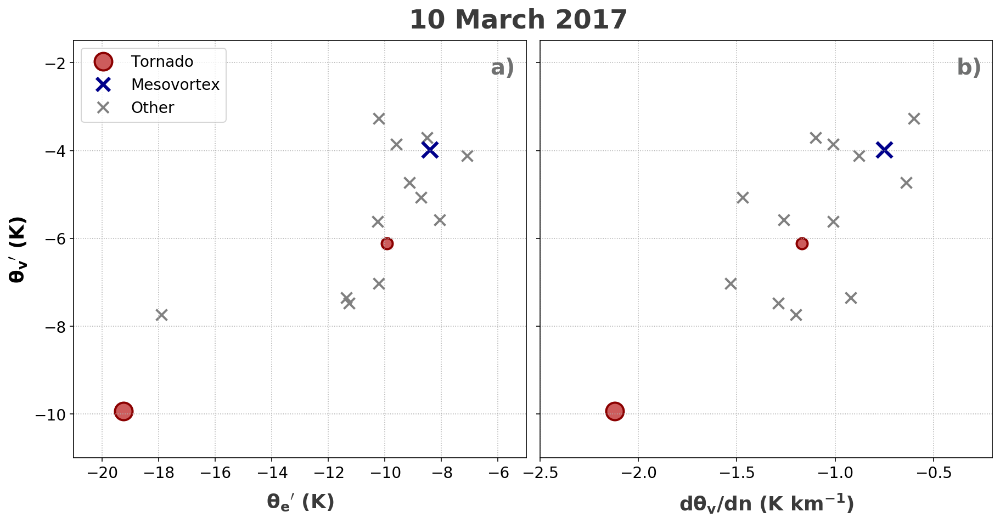

In [53]:
d_20170310=sns[sns['date']==20170310]
fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'

ax.scatter(d_20170310['TE'],d_20170310['TV'],marker='x',color='gray', s=(10**2), linewidth=2)

# tors
ax.scatter(d_20170310.loc['0108A']['TE'],d_20170310.loc['0108A']['TV'],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.scatter(d_20170310.loc['0216A']['TE'],d_20170310.loc['0216A']['TV'],\
        marker='x',color='w', s=(10**2), linewidth=2)

ax.scatter(d_20170310.loc['0216A']['TE'],d_20170310.loc['0216A']['TV'],\
        s=dist_15, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.scatter(d_20170310.loc['0104A']['TE'],d_20170310.loc['0104A']['TV'],marker='x',\
        s=nontorsize,color='darkblue',linewidth=nonwidth)


ax.grid(linestyle=':')

shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Other')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Mesovortex')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred',label='Tornado')
leg = ax.legend(handles = [tor, Nnon, non],loc=2, fontsize=14)#, title='Feature Near\nObservation')
plt.setp(leg.get_title(),fontsize=16)

ax.set_xlim(-21,-5);
ax.set_ylim(-11,-1.5);

ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


ax2.scatter(d_20170310['dTVdn'],d_20170310['TV'],marker='x',color='gray', s=(10**2), linewidth=2)

# tors
ax2.scatter(d_20170310.loc['0108A']['dTVdn'],d_20170310.loc['0108A']['TV'],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

# add white
ax2.scatter(d_20170310.loc['0216A']['dTVdn'],d_20170310.loc['0216A']['TV'],\
        marker='x',color='w', s=(10**2), linewidth=6)

ax2.scatter(d_20170310.loc['0216A']['dTVdn'],d_20170310.loc['0216A']['TV'],\
        s=dist_15, color=time_5, linewidth=2, edgecolors='darkred') #107

ax2.scatter(d_20170310.loc['0104A']['dTVdn'],d_20170310.loc['0104A']['TV'],marker='x',\
        s=nontorsize,color='darkblue',linewidth=nonwidth)


ax2.grid(linestyle=':')


ax2.set_xlim(-2.5,-0.2);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')

plt.subplots_adjust(wspace=.03)
plt.suptitle('10 March 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
#plt.savefig('{0}10MarchDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

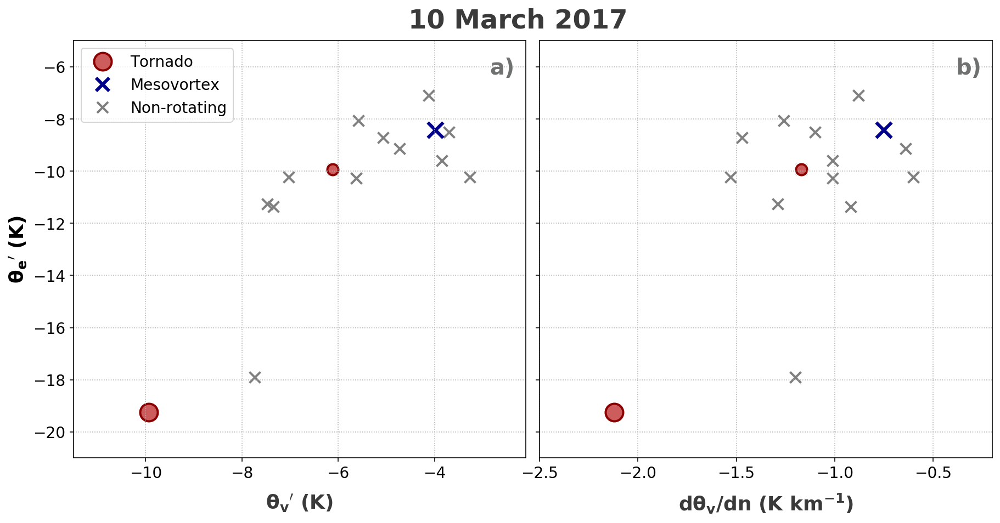

In [64]:
d_20170310=sns[sns['date']==20170310]
fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'

ax.scatter(d_20170310['TV'],d_20170310['TE'],marker='x',color='gray', s=(10**2), linewidth=2)

# tors
ax.scatter(d_20170310.loc['0108A']['TV'],d_20170310.loc['0108A']['TE'],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.scatter(d_20170310.loc['0216A']['TV'],d_20170310.loc['0216A']['TE'],\
        marker='x',color='w', s=(10**2), linewidth=2)

ax.scatter(d_20170310.loc['0216A']['TV'],d_20170310.loc['0216A']['TE'],\
        s=dist_15, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.scatter(d_20170310.loc['0104A']['TV'],d_20170310.loc['0104A']['TE'],marker='x',\
        s=nontorsize,color='darkblue',linewidth=nonwidth)


ax.grid(linestyle=':')

shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Non-rotating')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Mesovortex')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred',label='Tornado')
leg = ax.legend(handles = [tor, Nnon, non],loc=2, fontsize=14)#, title='Feature Near\nObservation')
plt.setp(leg.get_title(),fontsize=16)

ax.set_ylim(-21,-5);
ax.set_xlim(-11.5,-2.1);

ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


ax2.scatter(d_20170310['dTVdn'],d_20170310['TE'],marker='x',color='gray', s=(10**2), linewidth=2)

# tors
ax2.scatter(d_20170310.loc['0108A']['dTVdn'],d_20170310.loc['0108A']['TE'],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

# add white
ax2.scatter(d_20170310.loc['0216A']['dTVdn'],d_20170310.loc['0216A']['TE'],\
        marker='x',color='w', s=(10**2), linewidth=6)

ax2.scatter(d_20170310.loc['0216A']['dTVdn'],d_20170310.loc['0216A']['TE'],\
        s=dist_15, color=time_5, linewidth=2, edgecolors='darkred') #107

ax2.scatter(d_20170310.loc['0104A']['dTVdn'],d_20170310.loc['0104A']['TE'],marker='x',\
        s=nontorsize,color='darkblue',linewidth=nonwidth)


ax2.grid(linestyle=':')


ax2.set_xlim(-2.5,-0.2);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')

plt.subplots_adjust(wspace=.03)
plt.suptitle('10 March 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
#plt.savefig('{0}10MarchDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

### 20170430

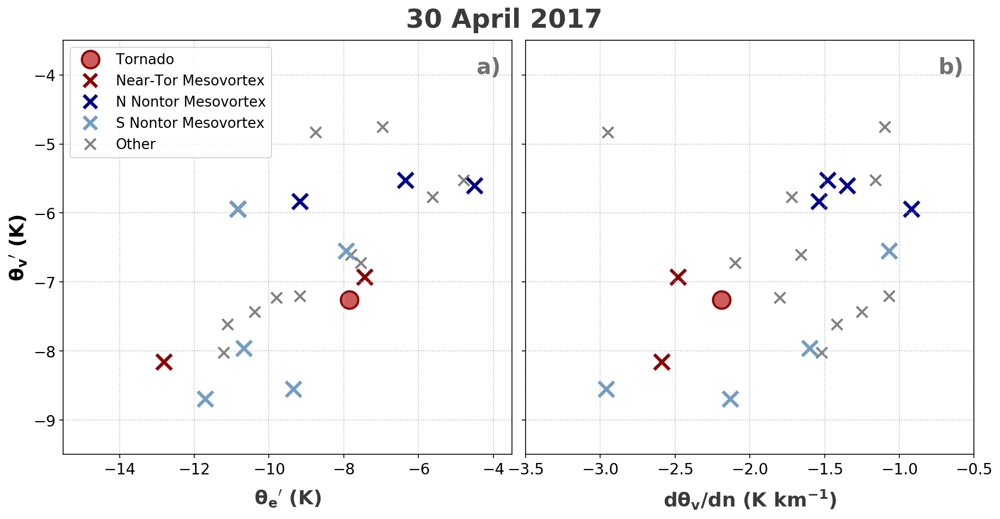

In [63]:
d_20170430 = sns[sns['date']==20170430]

d_20170430= d_20170430.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})


fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

tor = [d_20170430.loc[['0107A']]['TE'],\
     d_20170430.loc['0107A']['TV']]
S = [d_20170430.loc[['0106A', '0111A']]['TE'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]
N2 =[d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TE'],\
     d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TV']]
n2 = ['0102A', '0217A','0221A','0222A','0218A']


# 20170430
ax.scatter(d_20170430['TE'].loc[~d_20170430.index.isin(n2)]\
        ,d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2',alpha=1,linewidth=nonwidth)
# keep 
ax.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.grid(linestyle=':')



shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Other')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Nontor Mesovortex')
Nnon2 = mlines.Line2D([],[], color = '#749cc2', alpha=1,markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Nontor Mesovortex')
Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Near-Tor Mesovortex')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred', label='Tornado')
leg = ax.legend(handles = [tor,Snon, Nnon,Nnon2, non],
                 loc=2, fontsize=13)#,title='Feature Near Observation')
leg.get_title().set_fontsize('15') 




ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


n2 = ['0102A', '0217A','0221aA','0222A','0218A']

tor = [d_20170430.loc[['0107A']]['dTVdn'],\
     d_20170430.loc['0107A']['TV']]


S = [d_20170430.loc[['0106A', '0111A']]['dTVdn'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]


N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['dTVdn'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]

N2 =[d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['TV']]

# 20170430
ax2.scatter(d_20170430['dTVdn'].loc[~d_20170430.index.isin(n2)],\
        d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax2.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax2.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax2.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2', alpha=1,linewidth=nonwidth)

#ax2.scatter(d_20170430.loc[['0109A']]['dTVdn'], d_20170430.loc[['0109A']]['TV'], color='orange')

# keep 
ax2.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax2.grid(linestyle=':')


ax.set_xlim(-15.5,-3.5);
ax.set_ylim(-9.5,-3.5);

ax2.set_xlim(-3.5,-0.5);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')
plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
#plt.savefig('{0}30AprilDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [51]:
te = d_20170430['TE']
tv = d_20170430['TV']
print(te.mean())
print(tv.mean())

abs(d_20170430['TV']['0107A']) - abs(tv)

-8.718181818181817
-6.757727272727272


ID
0102A    1.32
0103A    1.49
0104A    0.03
0105A    0.54
0106A   -0.90
0107A    0.00
0108A    1.74
0109A    2.43
0110A   -0.76
0111A    0.33
0112A    1.74
0213A   -0.17
0214A    1.66
0215A    2.51
0216A    0.66
0217A   -0.70
0218A   -1.43
0219A   -0.35
0220A    1.43
0221A    0.71
0222A   -1.29
0224A    0.06
Name: TV, dtype: float64

In [48]:
print(d_20170430['TE']['0107A'], d_20170430['TV']['0107A'])

-7.85 -7.26


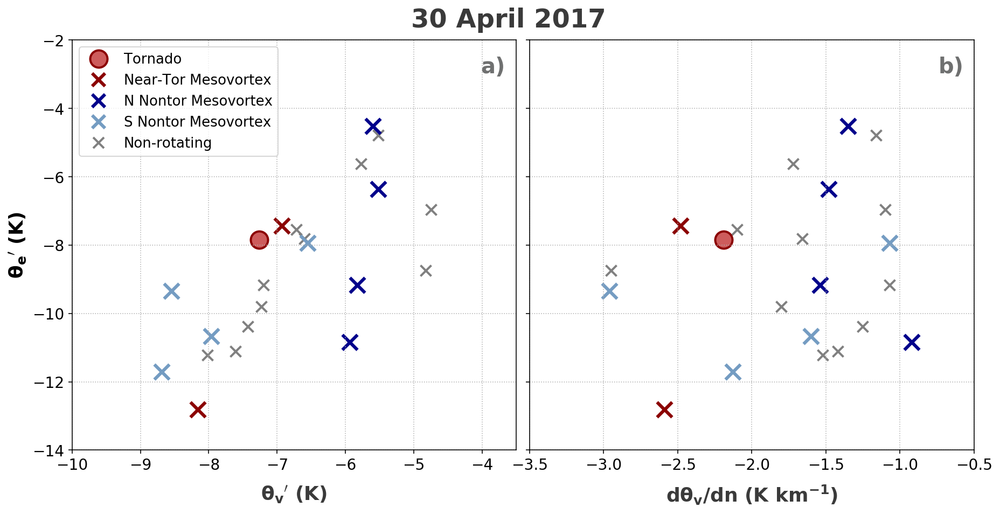

In [4]:

d_20170430 = sns[sns['date']==20170430]
d_20170430.index = d_20170430['ID']

d_20170430= d_20170430.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
#d_20170430.loc[:, 'dTVdn'] = d_20170430.loc[:, 'dTVdn']/d_20170430.loc[:, 'TV_BS']

fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

tor = [d_20170430.loc[['0107A']]['TV'],\
     d_20170430.loc['0107A']['TE']]
S = [d_20170430.loc[['0106A', '0111A']]['TV'],\
     d_20170430.loc[['0106A', '0111A']]['TE']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE']]
N2 =[d_20170430.loc[['0217A','0221A','0222A','0218A']]['TV'],\
     d_20170430.loc[['0217A','0221A','0222A','0218A']]['TE']]
n2 = ['0102A', '0217A','0221A','0222A','0218A']


# 20170430
ax.scatter(d_20170430['TV'].loc[~d_20170430.index.isin(n2)]\
        ,d_20170430['TE'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2',alpha=1,linewidth=nonwidth)
# keep 
ax.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.grid(linestyle=':')



shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Non-rotating')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Nontor Mesovortex')
Nnon2 = mlines.Line2D([],[], color = '#749cc2', alpha=1,markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Nontor Mesovortex')
Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Near-Tor Mesovortex')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred', label='Tornado')
leg = ax.legend(handles = [tor,Snon, Nnon,Nnon2, non],
                 loc=2, fontsize=13)#,title='Feature Near Observation')
leg.get_title().set_fontsize('15') 




ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


n2 = ['0102A', '0217A','0221aA','0222A','0218A']

tor = [d_20170430.loc[['0107A']]['dTVdn'],\
     d_20170430.loc['0107A']['TE']]


S = [d_20170430.loc[['0106A', '0111A']]['dTVdn'],\
     d_20170430.loc[['0106A', '0111A']]['TE']]

N = [d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['TE']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['dTVdn'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE']]

N2 =[d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['TE']]

# 20170430
ax2.scatter(d_20170430['dTVdn'].loc[~d_20170430.index.isin(n2)],\
        d_20170430['TE'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax2.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax2.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax2.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2', alpha=1,linewidth=nonwidth)

#ax2.scatter(d_20170430.loc[['0109A']]['dTVdn'], d_20170430.loc[['0109A']]['TV'], color='orange')

# keep 
ax2.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax2.grid(linestyle=':')

# for i in d_20170430.index:
#     ax2.text(d_20170430.loc[i]['dTVdn']+0.05,d_20170430.loc[i]['TE']+0.05, str(i) )

ax.set_xlim(-10,-3.5);
ax.set_ylim(-14,-2);

ax2.set_xlim(-3.5,-0.5);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')
plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
plt.savefig('{0}30AprilDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [94]:
d_20170430[:, 'dTVdn'] = d_20170430[:, 'dTVdn']/d_20170430[:, 'TE_BS']

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,Ua,Va,TOA_mods,Bsdist_mods,TE,TV,dTVdn,storm_u_OLD,storm_v_OLD,TE_BS,TV_BS
ID,,,,,,,,,,,,,,,,,,,,
0102A,20170430,0102A,SHYL,34.295900,-87.587100,linear,R,4/30/17 18:08,32.0,11.4,19.0,NaN,NaN,-10.84,-5.94,-0.92,12.3,9.9,340.39,301.76
0103A,20170430,0103A,SCMT,34.855100,-86.001700,linear,NR,4/30/17 20:42,25.0,10.1,17.6,NaN,NaN,-5.62,-5.77,-1.72,12.3,9.9,336.79,303.25
0104A,20170430,0104A,SLYN,35.339100,-87.032400,linear,NR,4/30/17 19:29,-1.0,12.4,18.6,NaN,NaN,-9.80,-7.23,-1.80,12.3,9.9,336.93,302.40
0105A,20170430,0105A,SSBR,34.622400,-86.080000,linear,NR,4/30/17 20:29,10.0,12.3,9.8,NaN,NaN,-7.54,-6.72,-2.10,12.3,9.9,340.76,304.20
0106A,20170430,0106A,SADN,34.214900,-87.161900,linear,R,4/30/17 18:47,32.0,10.8,18.1,1.0,NaN,-12.81,-8.16,-2.59,12.3,9.9,340.03,303.08
0107A,20170430,0107A,SCLM,34.194390,-86.798250,linear,T,4/30/17 19:08,27.0,13.1,16.3,NaN,NaN,-7.85,-7.26,-2.19,12.3,9.9,339.61,303.66
0108A,20170430,0108A,SPBG,35.323600,-86.634700,linear,NR,4/30/17 20:01,36.0,12.3,17.2,NaN,NaN,-4.79,-5.52,-1.16,12.3,9.9,339.32,302.72
0109A,20170430,0109A,SLBG,35.304500,-87.518500,linear,NR,4/30/17 18:28,-10.0,11.4,22.8,NaN,NaN,-8.75,-4.83,-2.95,12.3,9.9,337.67,301.49
0110A,20170430,0110A,SDGS,34.163200,-86.334100,linear,NR,4/30/17 20:01,2.0,12.3,12.3,NaN,NaN,-11.22,-8.02,-1.52,12.3,9.9,339.89,303.51


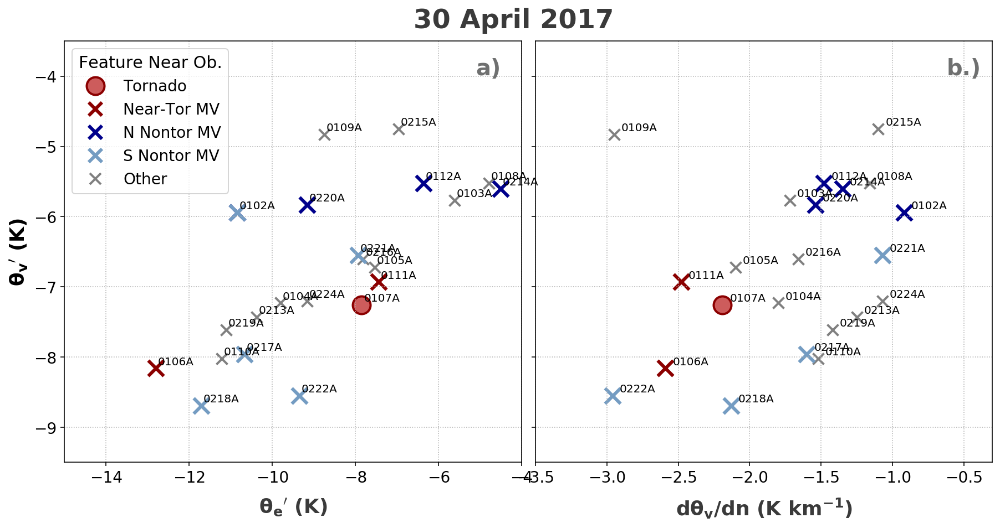

In [8]:
d_20170430 = sns[sns['date']==20170430]

d_20170430= d_20170430.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})


fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

tor = [d_20170430.loc[['0107A']]['TE'],\
     d_20170430.loc['0107A']['TV']]
S = [d_20170430.loc[['0106A', '0111A']]['TE'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]
N2 =[d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TE'],\
     d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TV']]
n2 = ['0102A', '0217A','0221A','0222A','0218A']


# 20170430
ax.scatter(d_20170430['TE'].loc[~d_20170430.index.isin(n2)]\
        ,d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2',alpha=1,linewidth=nonwidth)
# keep 
ax.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.grid(linestyle=':')

for i in d_20170430.index:
    ax.text(d_20170430.loc[i]['TE']+0.05,d_20170430.loc[i]['TV']+0.05, str(i) )


shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Other')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Nontor MV')
Nnon2 = mlines.Line2D([],[], color = '#749cc2', alpha=1,markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Nontor MV')
Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Near-Tor MV')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred', label='Tornado')
leg = ax.legend(handles = [tor,Snon, Nnon,Nnon2, non],
                 loc=2, fontsize=14, title='Feature Near Ob.')
leg.get_title().set_fontsize('15') 


ax.set_xlim(-15,-4);
ax.set_ylim(-9.5,-3.5);

ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


n2 = ['0102A', '0217A','0221aA','0222A','0218A']

tor = [d_20170430.loc[['0107A']]['dTVdn'],\
     d_20170430.loc['0107A']['TV']]


S = [d_20170430.loc[['0106A', '0111A']]['dTVdn'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]

N = [d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['TV']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['dTVdn'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]

N2 =[d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['TV']]

# 20170430
ax2.scatter(d_20170430['dTVdn'].loc[~d_20170430.index.isin(n2)],\
        d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax2.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax2.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax2.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2', alpha=1,linewidth=nonwidth)

#ax2.scatter(d_20170430.loc[['0109A']]['dTVdn'], d_20170430.loc[['0109A']]['TV'], color='orange')

# keep 
ax2.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

for i in d_20170430.index:
    ax2.text(d_20170430.loc[i]['dTVdn']+0.05,d_20170430.loc[i]['TV']+0.05, str(i) )

ax2.grid(linestyle=':')


ax2.set_xlim(-3.5,-0.3);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.9,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.9,0.92,'b.)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')
plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
#plt.savefig('{0}30AprilDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [97]:
d_20170422 = sns[sns['date']==20170422]
d_20170422

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,storm_u,storm_v,TOA_mods,Bsdist_mods,TE,TV,dTVdn
68,20170422,0102A,SHYL,34.29590,-87.58710,supercell,R,4/22/17 21:26,-50.0,11.0,-7.9,NaN,NaN,-11.70,-5.54,-1.03
69,20170422,0103A,SCMT,34.85510,-86.00170,supercell,T,4/22/17 22:49,36.0,21.2,-5.7,NaN,NaN,-9.78,-3.92,-0.84
70,20170422,0106A,SADN,34.21490,-87.16190,supercell,T,4/22/17 22:25,-44.0,11.0,-7.9,NaN,NaN,-16.08,-7.95,-1.62
71,20170422,0107A,SCLM,34.19439,-86.79825,supercell,R,4/22/17 23:10,-9.0,11.0,-7.9,NaN,NaN,-9.03,-4.05,-0.99
72,20170422,0213A,SHLG,34.90160,-86.53860,supercell,R,4/22/17 22:00,-42.0,21.2,-5.7,NaN,NaN,-12.38,-6.87,-1.44
73,20170422,0214A,SEMT,34.61760,-87.10140,supercell,NR,4/22/17 21:31,-51.0,21.2,-5.7,NaN,NaN,-12.49,-4.20,-1.00


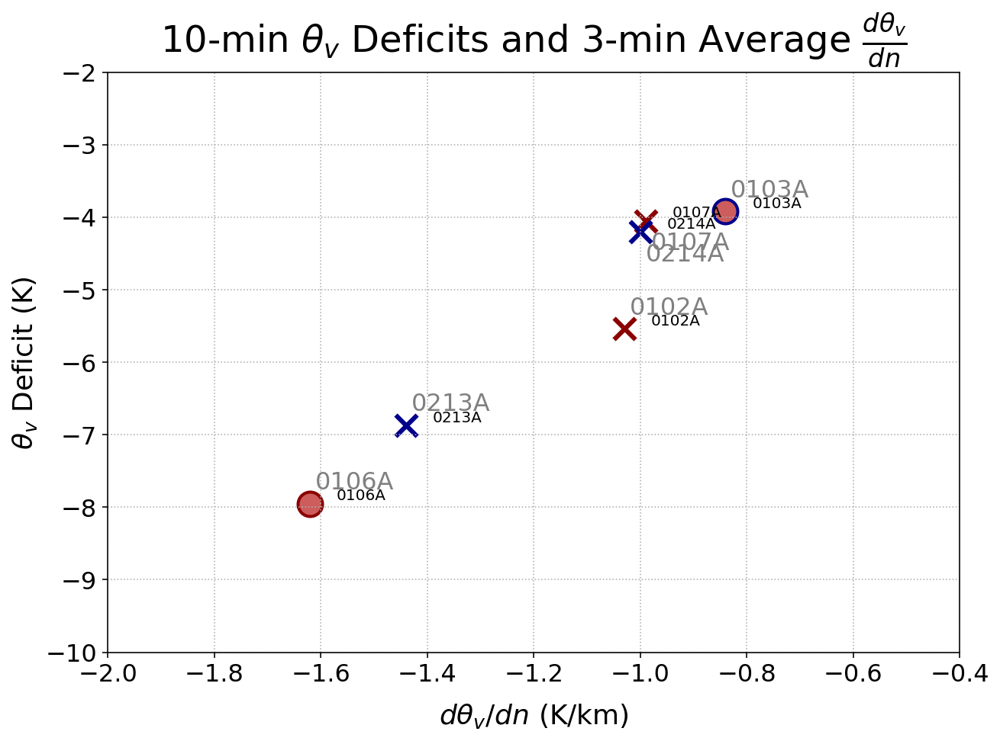

In [107]:
d_20170422 = sns[sns['date']==20170422]

d_20170422= d_20170422.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})



fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111)
plt.title(r'10-min ${\theta_v}$ Deficits and 3-min Average ${\frac{d\theta_v}{dn}}$',fontsize=24, y = 1.02)
plt.xlabel(r'$d\theta_v/{dn}}$ (K/km)', fontsize=18, labelpad = 10)
plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
xticks(fontsize=16)
yticks(fontsize=16)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

# tor = [[-9.2,-13.79],[-3.7,-6.65]] #103,106
# non = [[-4.6,-7.14,-12.89,-12.07],[-2.94,-3.07,-6.79,-3.95]]
# non = 102,107,213(?),214, tor = 103,106

#N, S
Ntor = [d_20170422.loc[['0103A']]['dTVdn'],d_20170422.loc[['0103A']]['TV']] #103,106
Stor = [d_20170422.loc[['0106A']]['dTVdn'],d_20170422.loc[['0106A']]['TV']] 
#non = [[-0.59,-0.51,-1.05,-0.56],[-2.94,-3.07,-6.79,-3.95]]

S = [d_20170422.loc[['0102A','0107A']]['dTVdn'],d_20170422.loc[['0102A','0107A']]['TV']]
N = [d_20170422.loc[['0214A','0213A']]['dTVdn'],d_20170422.loc[['0214A','0213A']]['TV']]


# 20170422

ax.scatter(Stor[0],Stor[1], marker='o',s=dist_10, color=time_5, linewidth=2, edgecolors='darkred')
ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)

ax.scatter(Ntor[0],Ntor[1], marker='o',s=dist_10, color=time_5, linewidth=2, edgecolors='darkblue')
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)

# keep 
for i in d_20170422.index:
    if i in ['0102A','0213A','0103A','0106A']:
        ax.text(d_20170422.loc[i]['dTVdn']+.01,d_20170422.loc[i]['TV']+.2,i, color='gray', fontsize=16)
    if i in ['0214A','0107A']:
        ax.text(d_20170422.loc[i]['dTVdn']+.01,d_20170422.loc[i]['TV']-.4,i, color='gray', fontsize=16)
grid(linestyle=':')

for i in d_20170422.index:
    ax.text(d_20170422.loc[i]['dTVdn']+0.05,d_20170422.loc[i]['TV']+0.05, str(i) )

# # legend disaster
# ax1 = ax.twinx()
# ax1.axis('off')

# shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
# non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Other')
# Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Supercell')
# Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Supercell')
# tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,marker = 'o', linewidth = 0,\
#                           label='Tornado')

# leg = legend(handles = [tor,Snon, Nnon],
#                  loc=2, fontsize=14, title='Feature Near Ob.')

# plt.setp(leg.get_title(),fontsize=16)

# ax.set_xlim(-15,-2.5);
# ax.set_ylim(-9,-1);


ax.set_xlim(-2.,-0.4);
ax.set_ylim(-10,-2);

ax.set_facecolor('w')
ax.patch.set_visible(False)


### Overall Deficits

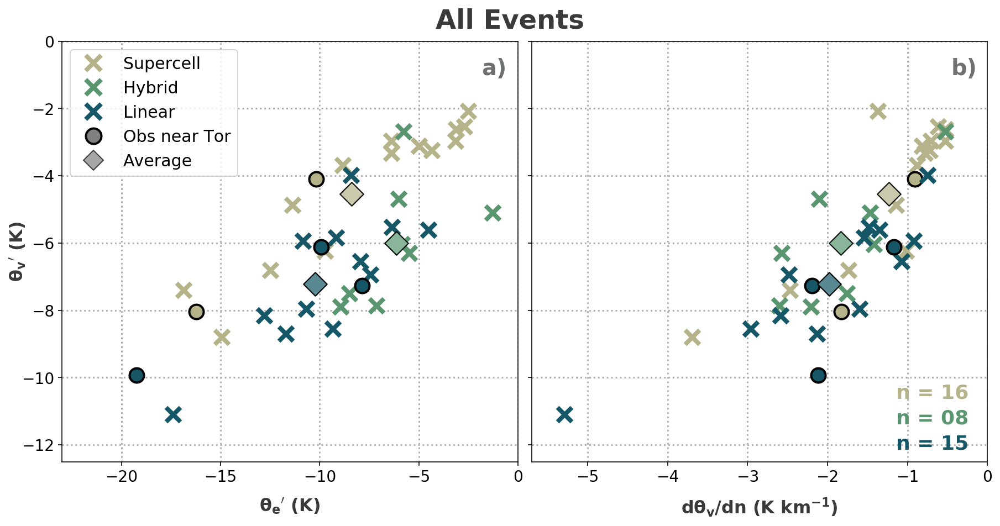

In [25]:
fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=16, labelpad = -5, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


# supercells
ax.scatter(get_mode('TE', 'supercell', 'R'), get_mode('TV', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('TE', 'supercell', 'T'), get_mode('TV', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('TE', 'mixed', 'R'), get_mode('TV', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('TE', 'linear', 'R'), get_mode('TV', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('TE', 'linear', 'T'), get_mode('TV', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax.scatter(get_mode_average('TE','supercell'),get_mode_average('TV','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE','supercell'),get_mode_average('TV','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor, avg],loc=2 ,fontsize = 15);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TV', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TV', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TV', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TV', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TV', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TV','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TV','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)


ax2.text(0.80, 0.15, 'n = 16', fontsize=18, color=supc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.09, 'n = 08', fontsize=18, color=mixc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.03, 'n = 15', fontsize=18, color=linc, weight='bold', transform=ax2.transAxes)

ax.set_xlim(-23, 0)
# ax.set_xlim(-22, 1);
ax.set_ylim(-12.5,0);
ax2.set_xlim(-5.7, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')

plt.suptitle('All Events', fontsize=24, weight='bold', color='#3a3a3a', y=.94);
#plt.savefig('{0}OverallDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);




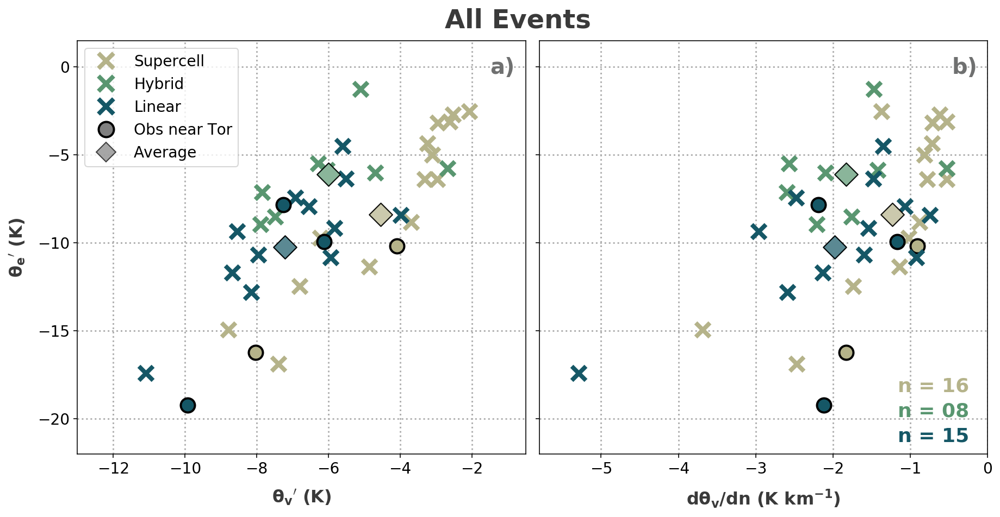

In [142]:
fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


# supercells
ax.scatter(get_mode('TV', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('TV', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('TV', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('TV', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('TV', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax.scatter(get_mode_average('TV','supercell'),get_mode_average('TE','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV','supercell'),get_mode_average('TE','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor, avg],loc=2 ,fontsize = 14);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TE','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TE','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)


ax2.text(0.80, 0.15, 'n = 16', fontsize=18, color=supc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.09, 'n = 08', fontsize=18, color=mixc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.03, 'n = 15', fontsize=18, color=linc, weight='bold', transform=ax2.transAxes)

ax.set_ylim(-22, 1.5)
# ax.set_xlim(-22, 1);
ax.set_xlim(-13,-.5);
ax2.set_xlim(-5.8, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')

plt.suptitle('All Events', fontsize=24, weight='bold', color='#3a3a3a', y=.94);
plt.savefig('{0}OverallDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);


In [145]:

mode='linear'
typ='R'
y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
for i in y.index:
    if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
        y.loc[i, var] = np.nan


AttributeError: 'Series' object has no attribute 'strftime'

In [146]:
y.loc[i]['TOA']

ID
0104A     3/10/17 5:25
0104A    3/21/17 21:12
Name: TOA, dtype: object

Text(0.92, 0.92, 'b)')

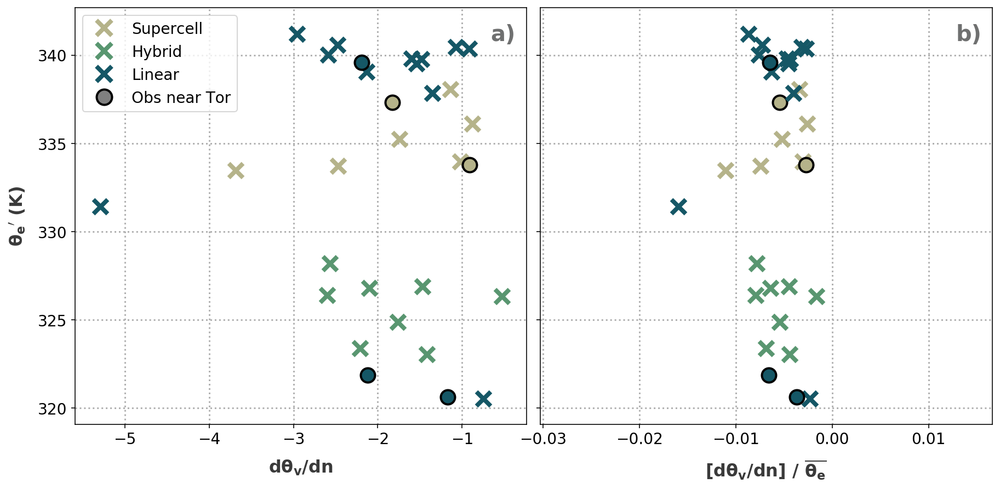

In [149]:



def get_mode(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
    for i in y.index:
        if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
            y.loc[i, var] = np.nan
    return y[var]



fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


ax.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TE_BS', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TE_BS', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TE_BS', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TE_BS', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TE_BS', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor],loc=2 ,fontsize = 14);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'[$\mathbf{d\theta_v/{dn}}$] / $\mathbf{\overline{\theta_e}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R')/get_mode('TE_BS', 'supercell', 'R'), get_mode('TE_BS', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T')/get_mode('TE_BS', 'supercell', 'T'), get_mode('TE_BS', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R')/get_mode('TE_BS', 'mixed', 'R'), get_mode('TE_BS', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R')/get_mode('TE_BS', 'linear', 'R'), get_mode('TE_BS', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T')/get_mode('TE_BS', 'linear', 'T'),get_mode('TE_BS', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)

# labels = ax2.get_xticklabels()
# ax2.set_xticklabels(labels, rotation=20.0)

#ax2.xaxis.set_ticks(np.arange(-0.02, 0.001, 0.004))
#ax2.xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
#ax2.set_xlim(-0.02, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')



In [150]:
sns[sns['date']==20170310]

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,Ua,...,TOA_mods,Bsdist_mods,TE,TV,dTVdn,storm_u_OLD,storm_v_OLD,TE_BS,TV_BS,Tdd_BS
11,20170310,0102A,SHYL,34.29590,-87.58710,linear,NR,3/10/17 7:21,-66.0,21.5,...,NaN,NaN,-9.59,-3.85,-1.01,26.3,-8.0,320.53,292.16,1.45
12,20170310,0103A,SCMT,34.85510,-86.00170,linear,NR,3/10/17 6:36,-54.0,25.1,...,NaN,NaN,-11.26,-7.47,-1.29,26.3,-8.0,320.86,296.62,6.36
13,20170310,0104A,SLYN,35.33910,-87.03240,linear,R,3/10/17 5:25,-51.0,23.6,...,NaN,NaN,-8.42,-3.98,-0.75,26.3,-8.0,320.55,293.69,3.39
14,20170310,0105A,SSBR,34.62240,-86.08000,linear,NR,3/10/17 6:50,-57.0,24.5,...,NaN,NaN,-10.22,-7.03,-1.53,26.3,-8.0,322.00,296.72,8.28
15,20170310,0107A,SCLM,34.19439,-86.79825,linear,NR,3/10/17 7:22,-70.0,21.5,...,NaN,NaN,-8.72,-5.07,-1.47,26.3,-8.0,321.63,294.14,4.10
16,20170310,0108A,SPBG,35.32360,-86.63470,linear,T,3/10/17 5:41,-60.0,21.3,...,NaN,NaN,-19.24,-9.93,-2.12,26.3,-8.0,321.87,293.84,3.31
17,20170310,0109A,SLBG,35.30450,-87.51850,linear,NR,3/10/17 5:07,-68.0,24.1,...,NaN,NaN,-17.90,-7.74,-1.20,26.3,-8.0,323.35,294.48,2.93
18,20170310,0110A,SDGS,34.16320,-86.33410,linear,NR,3/10/17 7:30,-37.0,23.8,...,-1.0,NaN,-7.10,-4.12,-0.88,26.3,-8.0,319.74,293.41,3.73
19,20170310,0111A,SLYS,34.55040,-86.55820,linear,NR,3/10/17 6:45,-56.0,24.5,...,NaN,NaN,-8.06,-5.58,-1.26,26.3,-8.0,321.50,294.72,5.75
20,20170310,0112A,SLGN,34.72540,-87.46250,linear,NR,3/10/17 6:20,-68.0,18.8,...,NaN,NaN,-8.51,-3.70,-1.10,26.3,-8.0,322.11,293.13,2.56


In [ ]:
def get_mode(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
    for i in y.index:
        if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
            y.loc[i, var] = np.nan
    return y[var]



fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


ax.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor],loc=2 ,fontsize = 14);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'[$\mathbf{d\theta_v/{dn}}$] / $\mathbf{\overline{\theta_e}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R')/get_mode('TE_BS', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T')/get_mode('TE_BS', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R')/get_mode('TE_BS', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R')/get_mode('TE_BS', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T')/get_mode('TE_BS', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)

# labels = ax2.get_xticklabels()
# ax2.set_xticklabels(labels, rotation=20.0)

ax2.xaxis.set_ticks(np.arange(-0.02, 0.001, 0.004))
#ax2.xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
ax2.set_xlim(-0.02, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')




In [131]:
list(labels)

[Text(-0.02, 0, ''),
 Text(-0.0175, 0, ''),
 Text(-0.015, 0, ''),
 Text(-0.0125, 0, ''),
 Text(-0.01, 0, ''),
 Text(-0.0075, 0, ''),
 Text(-0.005000000000000001, 0, '')]

In [137]:
np.arange(-0.02, 0.001, 0.004)

array([-0.02 , -0.016, -0.012, -0.008, -0.004,  0.   ])

In [125]:

mode = 'supercell'
typ = 'R'
var = 'TE'
y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
for i in y.index:
    if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
        y.loc[i, var] = np.nan

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [126]:
y

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,Ua,Va,TOA_mods,Bsdist_mods,TE,TV,dTVdn,storm_u_OLD,storm_v_OLD,TE_BS,TV_BS
0,20160331,0215A1,SSJH,35.038000,-87.471900,supercell,R,3/31/16 22:49,-60.0,17.8,3.6,NaN,NaN,NaN,-2.08,-1.37,22.8,4.6,NaN,NaN
1,20160331,0215A2,SSJH,35.038000,-87.471900,supercell,R,3/31/16 23:07,-30.0,16.6,3.3,NaN,32.2,NaN,-3.11,-0.82,22.8,4.6,NaN,NaN
2,20160331,0217A,NaN,35.015450,-87.671650,supercell,R,3/31/16 22:32,-40.0,15.0,3.8,NaN,10.6,NaN,-2.96,-0.71,17.7,6.6,NaN,NaN
3,20160331,0218A,NaN,34.968474,-87.669926,supercell,R,3/31/16 22:49,-22.0,17.8,3.6,NaN,NaN,NaN,-3.24,-0.72,17.7,6.6,NaN,NaN
4,20160331,0220A,NaN,35.151446,-87.744289,supercell,R,3/31/16 22:16,-6.0,15.4,3.9,NaN,NaN,NaN,-3.32,-0.78,17.7,6.6,NaN,NaN
5,20160331,0221A,NaN,35.052518,-87.680796,supercell,R,3/31/16 22:28,-19.0,19.2,7.7,NaN,NaN,NaN,-2.53,-0.62,17.7,6.6,NaN,NaN
6,20160331,0222A,NaN,35.084061,-87.719905,supercell,R,3/31/16 22:16,-30.0,15.4,3.9,NaN,10.5,NaN,-2.62,-0.53,17.7,6.6,NaN,NaN
7,20160430,0101A,SDTR,34.617600,-87.101400,supercell,R,4/30/16 21:42,32.0,9.6,16.0,-1.0,NaN,NaN,-2.97,-0.53,13.5,14.8,NaN,NaN
8,20170301,0103A,NaN,34.378112,-86.912166,supercell,R,3/1/17 19:45,-11.0,26.5,7.6,NaN,NaN,-16.88,-7.40,-2.47,27.6,7.4,333.72,299.66
9,20170301,0109A,NaN,34.313122,-86.900077,supercell,R,3/1/17 19:50,15.0,25.6,7.3,NaN,NaN,-9.73,-6.23,-1.02,27.6,7.4,333.97,300.38


### Messing with the colors for the relfectivity plots       

In [9]:
import cartopy.crs as ccrs 
import cartopy.feature as cfeature
import cartopy
#import cartopy.io.shapereader as shpreader
from metpy.plots import USCOUNTIES
import datetime as dt
import matplotlib.pyplot as plt

# re-write code for cartopy versions if needed later
from WarningPoly import plot_warnings;

from netCDF4 import num2date
import numpy as np
import pyart;
import glob
import pytz
import SNmods3 as snmods
from functions_radar3 import get_radar_from_aws,_nearestDate
from scipy import interpolate
import matplotlib.cm as cm
import scipy.ndimage as nd
from collections import OrderedDict
import pandas as pd
import probe_info
import pickle
import cmocean

probe_locs = probe_info.probe_locs_2017

def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=3, fontsize=12, text_pad=5):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    text pad controls the spacing between the text (km, distance1, distance2) and the scale bar.
        squished numbers are bad!
    
    edited by Jessie. Found on GitHub - https://github.com/SciTools/cartopy/issues/490
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    # the edge is the black lines in between and extending on the edges of the white and gray parts
    # sbx is the center. length * 500 == half the length
    
    edge = 500
    bar_xs = [sbx - length * 500 - edge, sbx + length * 500 +edge]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth+4,solid_capstyle="butt")  # background
    
    #add colors - 4 colors
    x1, x2, x3, x4, x5 = sbx-length*500, sbx -length*250, sbx, sbx+length*250, sbx+length*500
    ax.plot([x1,x2-edge/2], [sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt")
    ax.plot([x2+edge/2,x3-edge/2] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt")
    ax.plot([x3+edge/2,x4-edge/2] ,[sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt")
    ax.plot([x4+edge/2,x5] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt")
    
    # add "km", center point, and end point
    y_lift = linewidth*text_pad
    ax.text(x3, sby+length*y_lift , str(round(2 * length / 4)), transform=tmc,
                    horizontalalignment='center', verticalalignment='bottom',
                    color='k', fontsize=fontsize)
    ax.text(x5-length*50, sby+length*y_lift , str(round(length)), transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)
    ax.text(x1+length*60, sby+length*y_lift , 'km', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)

from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.ticker as mticker

def plot_lat_lon(ax, lon_labels, lat_labels, top_label=False, left_label=False, bottom_label=True, right_label=True, linewidth=1,
                color='gray', text_color='gray',text_size=15, alpha=0.5, linestyle='--'):

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=linewidth, color=color, alpha=alpha, linestyle=linestyle)
    gl.xlabels_top = top_label
    gl.ylabels_left = left_label
    gl.xlabels_bottom = bottom_label
    gl.ylabels_right = right_label
    #gl.xlines = False
    gl.xlocator = mticker.FixedLocator(lon_labels)
    gl.ylocator = mticker.FixedLocator(lat_labels)
    gl.xformatter = LONGITUDE_FORMATTER

    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': text_size, 'color': text_color}
    gl.ylabel_style = {'size': text_size, 'color': text_color}
    
    
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import matplotlib
import cmocean

def rgb(hexcol):
    return matplotlib.colors.to_rgba(hexcol)
def make_cmap(colors, n_bin=50):
    return LinearSegmentedColormap.from_list('newcmap', colors, N=n_bin)

def min_col(cmap, minval=0.0, maxval=1.0, n=15):
    new_cmap = LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap



## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [3]:
# Set up our projection
crs = ccrs.PlateCarree()
globe = ccrs.Globe(datum='WGS84',ellipse='sphere')

# Get data to plot state and province boundaries
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lakes',
        scale='10m',
        facecolor='none')

west_lon=-88
south_lat=33.7
east_lon=-85.6
north_lat=35.8


#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())
date='20170430'

In [289]:
import matplotlib
def rgb(hexcol):
    return matplotlib.colors.to_rgba(hexcol)

In [290]:
cmocean.cm.rain(0.5)

(0.23772509690655058, 0.5574166090031631, 0.4294119794031988, 1.0)

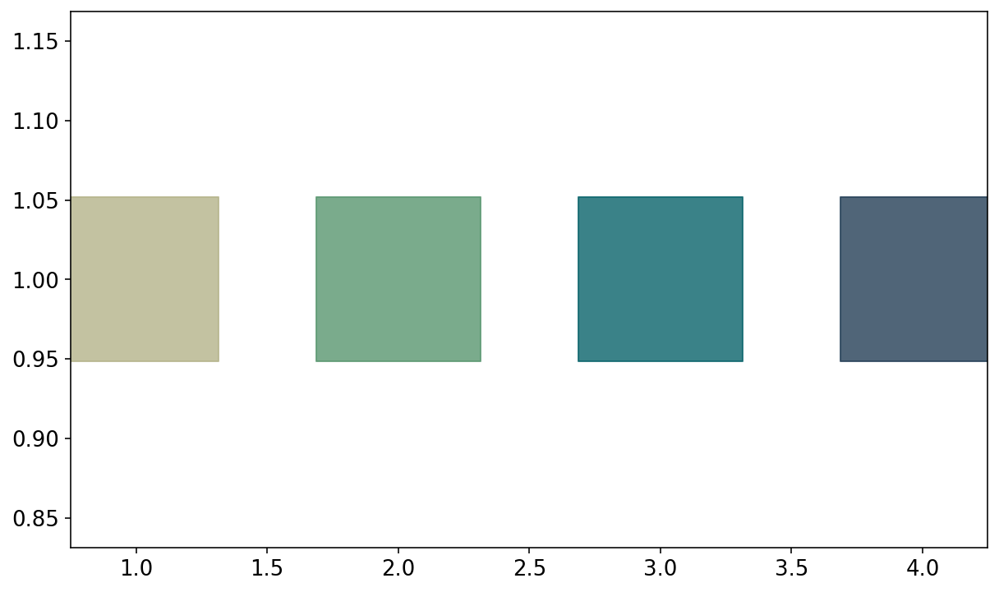

In [340]:
fig = plt.figure(figsize=(10,6))
clist = ['#337a55','#115696','#111e96','#4f1196','#861196']
clist = ['#2a7b9b','#1d4469','#272752','#511849','#900c3f']
clist = ['#327e8f','#1d4b69','#272752','#511849','#900c3f']

clist = [cmocean.cm.rain(0.25),cmocean.cm.rain(0.45),cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
plt.scatter([1,2,3,4], [1,1,1,1], marker='s', s=(100**2), color=clist, alpha=0.8)
#plt.ylim(0.975, 1.025)

(720, 1832)
(720, 1832)
(720, 1832)
(720, 1832)


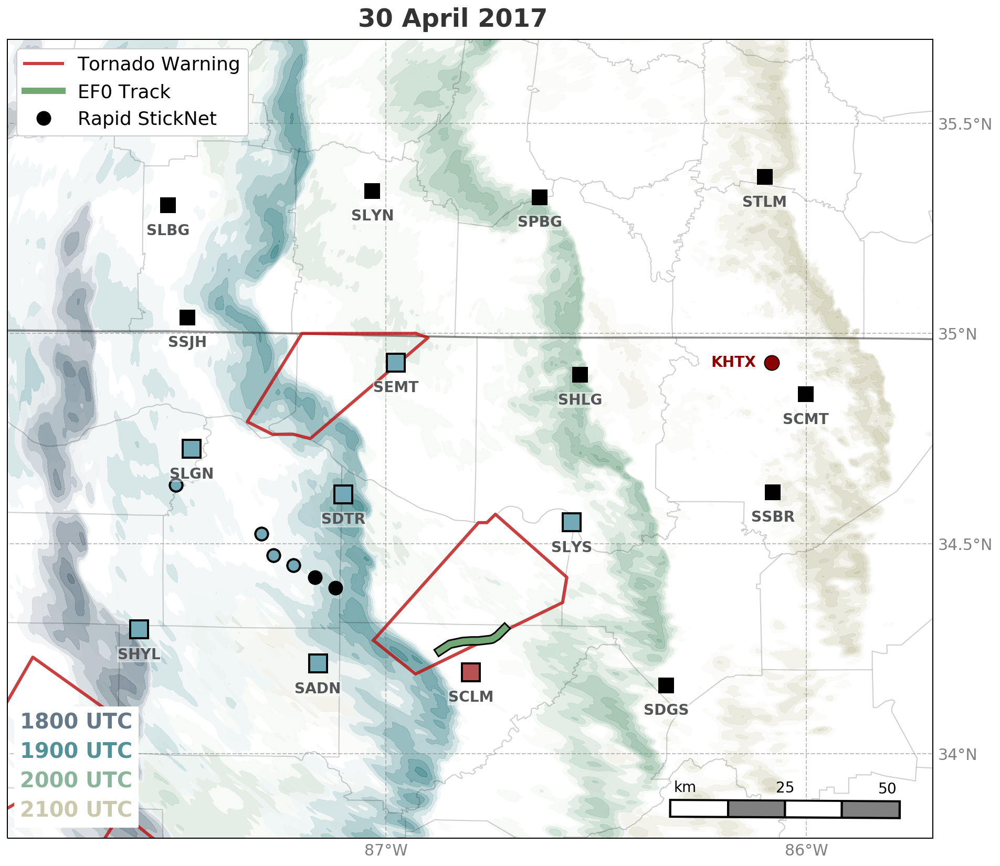

In [353]:
fig = plt.figure(1, figsize=(18, 14))
ax = plt.subplot(111, projection=crs)
west_lon=-87.9
south_lat=33.8
east_lon=-85.7
north_lat=35.7
date='20170430'


#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())
ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)

ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
# use 20m for testing, and 500k for final plots
       
# plot the warning poly
poly = pickle.load(open('{0}_TorPoly.p'.format(date), 'rb'))
plot_warnings(poly, ax, linewidth = 3,alpha=0.8, color='#bc1010',label = 'Tornado Warning')#    

# plot tornado track
tortrack = pickle.load(open('20170430_TorTrack.p', 'rb'))
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = 'k', linewidth=9, zorder=29)
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = '#71a873', linewidth=6, label='{} Track'.format(tortrack.loc[0]['rating']),zorder=30)
    
# add the StickNets
for n,probe in enumerate(probe_locs):
    if n <16:
        lat,lon = probe_locs[probe][0],probe_locs[probe][1]
        ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 10, markeredgewidth=5)#, label='StickNet')
        ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 10, markeredgewidth=3)
        
        if probe in ['0102A', '0106A', '0214A', '0111A', '0217A','0112A'] :
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#74a9b8', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
        
        if probe == '0107A':
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#b85151', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
            
        if lat > south_lat and lat < north_lat: # don't let SN plot outside of plot
            if lon < east_lon and lon > west_lon:
                plt.text(lon,lat-.06, probe_locs[probe][3], fontsize=14,\
                             ha='center', va='center', weight='bold', color='#545556',\
                             bbox=dict(facecolor='w', alpha=0.4, edgecolor='w', pad=0))
                
# add the rapid probes                
rapid_locs = {
 '0222': [-87.26764,34.472091],
 '0221': [-87.296503,34.523322],
 '0219': [-87.120229,34.394485],
 '0218': [-87.21975,34.448162],
 '0224': [-87.16902,34.420291],
 '0220': [-87.500392,34.639214]}
for n, probe in enumerate(rapid_locs):
    lat,lon = rapid_locs[probe][1],rapid_locs[probe][0]
    ax.plot(lon,lat, marker = 'o', color = 'k', linewidth=0.0, 
            markersize = 7, markeredgewidth=7, label='Rapid StickNet')
    ax.plot(lon,lat, marker = 'o', color = 'k', linewidth=0.0, 
            markersize = 7, markeredgewidth=3)
    
    if probe in ['0220','0221','0222','0218'] :
        ax.plot(lon,lat, marker = 'o', color = 'k', linewidth=0.0, 
            markersize = 7, markeredgewidth=7)
        ax.plot(lon,lat, marker = 'o', color = '#74a9b8', linewidth=0.0, 
            markersize = 7, markeredgewidth=3)
        
# Plot Radar Outlines
i = 0
clist = ['#337a55','#115696','#111e96','#4f1196','#861196']
clist = [cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
clist = [cmocean.cm.rain(0.25),cmocean.cm.rain(0.45),cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
for hour in [21,20,19,18]:
    for mins in [0]:
        analysis_time = dt.datetime(2017,4,30,hour, mins)
        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

        rdata = pickle.load(open(fname, 'rb'))
        lons, lats, ref = rdata[0], rdata[1], rdata[2]
        print(np.shape(ref))
   
        smooth = nd.gaussian_filter(ref, sigma = 1.1)

#         refmap = make_cmap([rgb('#a7d1ae'),rgb('#e6db8e'),rgb('#d9aa68'),rgb('#b2776b'), rgb('#a34531')])
#         newcmap=make_cmap([rgb('#a7d1ae'),rgb('#e6db8e'),rgb('#d9aa68'),rgb('#b2776b'), rgb('#a34531')])
        
        newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
        ax.contourf(lons, lats, smooth, levels=np.arange(30,70,5), cmap=min_col(newcmap, minval=0), alpha=0.8)
        i+=1

# Mark the radar
lat_0,lon_0 = 34.93055725097656,-86.08361053466797 # KHTX
ax.plot(lon_0, lat_0, marker='o', color='k', linewidth=0.0,markersize = 14)
ax.plot(lon_0, lat_0, marker='o', color='darkred', linewidth=0.0,markersize = 12)
ax.text(lon_0-0.09, lat_0, 'KHTX', fontsize=14, ha='center', va='center', weight='bold', color='darkred',\
                             bbox=dict(facecolor='w', alpha=0.4, edgecolor='w', pad=0))



# legend
handles, labels =ax.get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(),fontsize=18, loc=2, framealpha=1)

# add scale bar
scale_bar(ax, length=50, location=(0.84, 0.035), linewidth=14, fontsize=14)

# add lat lons
lons, lats =[-88, -87, -86, -85],[33.5, 34.0,34.5, 35.0, 35.5, 36]
plot_lat_lon(ax, lons, lats)


# add times in corner
i, lon, bot_lat=0, -87.87, 33.85
for time in [21,20,19,18]:
    plt.text(lon, bot_lat+(.07*i), '{}00 UTC'.format(time), fontsize=20, color=clist[i], weight='bold',
            bbox=dict(facecolor='white', edgecolor='white',pad=5), alpha=0.7)
    i+=1
 
plt.suptitle('30 April 2017', fontsize=24,weight='bold', y=0.91, alpha=0.8)
file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/Pub_Figures/'
file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/PubPlots/'
#plt.savefig('{0}30April_CaseOverview.png'.format(file_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

(720, 1832)
(720, 1832)
(720, 1832)
(720, 1832)
(720, 1832)


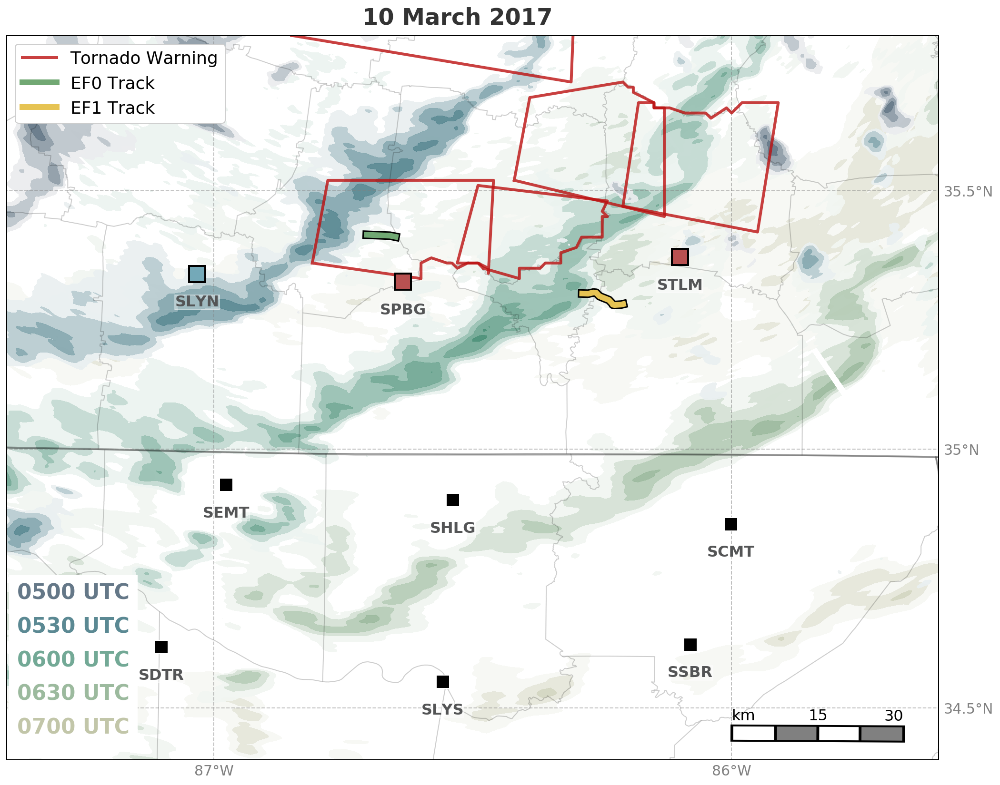

In [352]:
fig = plt.figure(1, figsize=(18, 14))
ax = plt.subplot(111, projection=crs)

west_lon=-87.4
south_lat=34.4
east_lon=-85.6
north_lat=35.8
date='20170310'

#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())
ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)

ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
                                                        # use 20m for testing, and 500k for final plots
    
# plot the warning poly
poly = pickle.load(open('{0}_TorPoly.p'.format(date), 'rb'))
plot_warnings(poly, ax, linewidth = 3,alpha=0.8, color='#bc1010',label = 'Tornado Warning')#
    
    
# add the StickNets
for n,probe in enumerate(probe_locs):
    if n <16:
        lat,lon = probe_locs[probe][0],probe_locs[probe][1]
        ax.plot(lon,lat, marker = 's', color = 'w', linewidth=0.0, 
                markersize = 10, markeredgewidth=5)
        
        ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 10, markeredgewidth=3)
        
        if probe == '0104A':
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#74a9b8', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
        
        if probe == '0108A' or probe == '0216A':
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#b85151', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
        
        if lat > south_lat and lat < north_lat: # don't let SN plot outside of plot
            if lon < east_lon and lon > west_lon:
                plt.text(lon,lat-.055, probe_locs[probe][3], fontsize=16,\
                             ha='center', va='center', weight='bold', color='#545556',\
                             bbox=dict(facecolor='w', alpha=0.4, edgecolor='w', pad=0))

# Plot Radar Outlines

i = 0
clist = ['#337a55','#115696','#111e96','#4f1196','#861196']
#clist = ['#2a7b9b','#1d4469','#272752','#511849','#900c3f']
clist = ['#327e8f','#1d4b69','#272752','#511849','#900c3f']
clist = [cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)]

times = ['700', '630', '600', '530', '500']
for time in times:
    hour, mins = int(time[0]), int(time[1:])
    analysis_time = dt.datetime(2017,3,10,hour, mins)
    date = analysis_time.strftime('%Y%m%d')
    HHMM = analysis_time.strftime('%H%M')
    fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

    rdata = pickle.load(open(fname, 'rb'))
    lons, lats, ref = rdata[0], rdata[1], rdata[2]
    print(np.shape(ref))

    smooth = nd.gaussian_filter(ref, sigma = 1.1)
    newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
    ax.contourf(lons, lats, smooth, levels=np.arange(40,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)
    i+=1

    


# plot tornado track
tortrack = pickle.load(open('20170310_TorTrack.p', 'rb'))

# EFO
ax.plot(tortrack.iloc[1]['lons'],tortrack.iloc[1]['lats'], 
        color = 'k', linewidth=9)
ax.plot(tortrack.iloc[1]['lons'],tortrack.iloc[1]['lats'], 
        color = '#71a873', linewidth=6, label='{} Track'.format(tortrack.loc[1]['rating']))
#EF1
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = 'k', linewidth=9)
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = '#e6c353', linewidth=6, label='{} Track'.format(tortrack.loc[0]['rating']))

# legend
handles, labels =ax.get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(),fontsize=18, loc=2, framealpha=1)

# add scale bar
scale_bar(ax, length=30, location=(0.87, 0.035), linewidth=14, fontsize=16)

# add lat lons
lons, lats =[-88, -87, -86, -85],[33.5, 34.0,34.5, 35.0, 35.5, 36]
plot_lat_lon(ax, lons, lats)

# add times in corner
i, lon, bot_lat=0, -87.37, 34.45
for time in times:
    plt.text(lon-0.01, bot_lat+(.065*i), '0{} UTC'.format(time), fontsize=22, color=clist[i], weight='bold',
            bbox=dict(facecolor='white', edgecolor='white',pad=8), alpha=0.7)
    i+=1

plt.suptitle('10 March 2017', fontsize=24,weight='bold', y=0.91, alpha=0.8)
#file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/Pub_Figures/'
file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/PubPlots/'
#plt.savefig('{0}10March_CaseOverview.png'.format(file_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [4]:
analysis_time = dt.datetime(2017,4,30,19)
date = analysis_time.strftime('%Y%m%d')
HHMM = analysis_time.strftime('%H%M')
fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

rdata = pickle.load(open(fname, 'rb'))
lons, lats, ref = rdata[0], rdata[1], rdata[2]

In [ ]:

LO, LA = np.meshgrid(lons[::5], lats[::5])
plt.contourf(LO, LA, ref)

### 9 panel all event figure, requested by Matt Parker

In [10]:
def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=3, fontsize=12, text_pad=5, inner_spacing=2):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    text pad controls the spacing between the text (km, distance1, distance2) and the scale bar.
        squished numbers are bad!
    
    edited by Jessie. Found on GitHub - https://github.com/SciTools/cartopy/issues/490
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    # the edge is the black lines in between and extending on the edges of the white and gray parts
    # sbx is the center. length * 500 == half the length
    
    #edge = 500
    edge = inner_spacing*100
    bar_xs = [sbx - length * 500 - edge, sbx + length * 500 +edge]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth+4,solid_capstyle="butt", clip_on=False)  # background
    
    #add colors - 4 colors
    x1, x2, x3, x4, x5 = sbx-length*500, sbx -length*250, sbx, sbx+length*250, sbx+length*500
    ax.plot([x1,x2-edge/2], [sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x2+edge/2,x3-edge/2] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x3+edge/2,x4-edge/2] ,[sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x4+edge/2,x5] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    
    # add "km", center point, and end point
    y_lift = linewidth*text_pad
    ax.text(x3, sby+length*y_lift , str(round(2 * length / 4)), transform=tmc,
                    horizontalalignment='center', verticalalignment='bottom',
                    color='k', fontsize=fontsize)
    ax.text(x5-length*50, sby+length*y_lift , str(round(length)), transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)
    ax.text(x1+length*60, sby+length*y_lift , 'km', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [60]:
#['1700', '1730', '1800', '1830', '1900','1930', '2000']:#['2100', '2130','2200', '2230', '2300']:
#'2330','2300','2230','2200'
for time in ['2215','2245','2315']:
        hour = int(time[0:2]); mins=int(time[2:])
        analysis_time = dt.datetime(2016,3,31,hour, mins)
        station = 'KHTX'
        radar_namelist, radar_list = get_radar_from_aws(station, analysis_time, analysis_time)
        radar = radar_list[0]
        lat_pos, lon_pos, _ = radar.get_gate_lat_lon_alt(0)
        data_ref = radar.get_field(0,'reflectivity')

        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)
        pickle.dump([lon_pos, lat_pos, data_ref], open(fname, 'wb') )

308 308
315 315
321 321


In [7]:
import matplotlib.patheffects as path_effects


import probe_info
probe_locs = probe_info.probe_locs_2017
all_lats = [probe_locs[x][0] for x in probe_locs.keys()]
all_lons = [probe_locs[x][1] for x in probe_locs.keys()]


west_lon=-87.9
south_lat=33.82
east_lon=-85.7
north_lat=35.78


#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())



events = [dt.datetime(2016,3,31), dt.datetime(2016,4,30), dt.datetime(2017,3,1),
          dt.datetime(2017,3,10), dt.datetime(2017,3,21), dt.datetime(2017,3,25),
          dt.datetime(2017,3,27), dt.datetime(2017,4,22), dt.datetime(2017,4,30)]


time_dict = {dt.datetime(2016,3,31):['2300','2245','2230','2215','2200'], 
             dt.datetime(2016,4,30):['2300','2230', '2200','2130','2100'], 
             dt.datetime(2017,3,1):['2000','1930','1900','1830'],
             dt.datetime(2017,3,10):['0700', '0630', '0600', '0530', '0500'], 
             dt.datetime(2017,3,21):[], 
             dt.datetime(2017,3,25):[],
             dt.datetime(2017,3,27):[], 
             dt.datetime(2017,4,22):[], 
             dt.datetime(2017,4,30):['2100','2000','1900','1800']}

col_dict = {dt.datetime(2016,3,31):[cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)], 
             dt.datetime(2016,4,30):[cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)], 
             dt.datetime(2017,3,1):[cmocean.cm.rain(0.35),cmocean.cm.rain(0.55),cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)],
             dt.datetime(2017,3,10):[cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)], 
             dt.datetime(2017,3,21):[], 
             dt.datetime(2017,3,25):[],
             dt.datetime(2017,3,27):[], 
             dt.datetime(2017,4,22):[], 
             dt.datetime(2017,4,30):[cmocean.cm.rain(0.25),cmocean.cm.rain(0.45),cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
           }

def get(ax,e):
    clist = col_dict[events[e]]

    times = time_dict[events[e]]
    
    for i, time in enumerate(times):
        hour, mins = int(time[0:2]), int(time[2:])
        analysis_time = events[e].replace(hour=2, minute=mins)
        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

        rdata = pickle.load(open(fname, 'rb'))
        lons, lats, ref = rdata[0], rdata[1], rdata[2]
        print(np.shape(ref))

        smooth = nd.gaussian_filter(ref, sigma = 1.1)
        newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
        ax.contourf(lons, lats, smooth, levels=np.arange(40,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)
    

In [24]:
ratio = (north_lat - south_lat)/(west_lon-east_lon)

center_lat = ev2['Lats'].append(ev1['Lats']).mean()
center_lon = ev2['Lons'].append(ev1['Lons']).mean()

dlat = .2

dlon = dlat / ratio

LL = (center_lon-dlon),(center_lat+dlat)
UR = (center_lon+dlon,(center_lat-dlat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())

In [37]:
def set_plot_ratio(dlat, ev1, ev2, ax, ratio):
    center_lat = ev2['Lats'].append(ev1['Lats']).mean()
    center_lon = ev2['Lons'].append(ev1['Lons']).mean()
    dlat = .4
    dlon = dlat / ratio
    LLn = crs.transform_point((center_lon-dlon),(center_lat+dlat),ccrs.PlateCarree())
    URn = crs.transform_point((center_lon+dlon),(center_lat-dlat),ccrs.PlateCarree())
    ax.set_extent([LLn[0], URn[0], LLn[1], URn[1]], crs)

In [21]:
alllats.mean()

35.049707

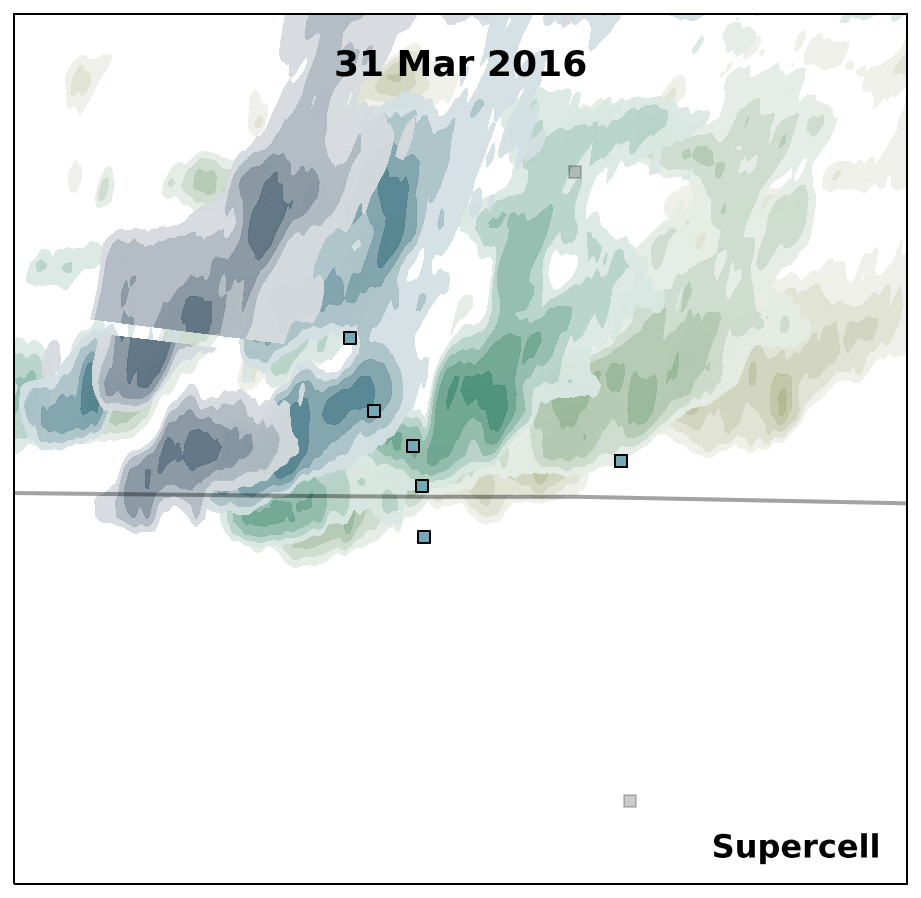

In [75]:
e=0

# need to keep the ratio the same of lat to lon 



fig, ax=plt.subplots(1,1, figsize=(8,8), sharex=True, sharey=True, subplot_kw={'projection': crs} )




ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
#ax.add_feature(USCOUNTIES.with_scale('20m'), alpha=0.1, linewidth=0.5) 
ax.set_aspect('auto')



# RADAR DATA
clist = col_dict[events[e]]

times = time_dict[events[e]]

for i, time in enumerate(times):
    hour, mins = int(time[0:2]), int(time[2:])
    analysis_time = events[e].replace(hour=hour, minute=mins)
    date = analysis_time.strftime('%Y%m%d')
    HHMM = analysis_time.strftime('%H%M')
    fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

    rdata = pickle.load(open(fname, 'rb'))
    lons, lats, ref = rdata[0], rdata[1], rdata[2]
    #print(np.shape(ref))

    smooth = nd.gaussian_filter(ref, sigma = 0.8)
    newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
    ax.contourf(lons, lats, smooth, levels=np.arange(40,70,5), cmap=min_col(newcmap, minval=0.1), alpha=0.95)



# TITLE                                              
ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=18, weight='bold',
        transform=ax.transAxes)



# plotting sticknets
if events[e] != dt.datetime(2017,3,1):
    ax.scatter(all_lons, all_lats, marker='s', color='k', alpha=0.2, transform=crs)

ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
ev1 = ev[ev['type'] == 'R']
lons = ev1['Lons']; lats = ev1['Lats']
ax.scatter(lons, lats, marker='s', color='#74a9b8', transform=crs, label='StickNet', ec='k')

ev2 = ev[ev['type'] == 'T']
lons = ev2['Lons']; lats = ev2['Lats']
ax.scatter(lons, lats, marker='s', color='#b85151', transform=crs, label='StickNet', ec='k')


# mode
if ev['mode'].iloc[0] == 'linear':
    mode = 'Linear'
if ev['mode'].iloc[0] == 'mixed':
    mode = 'Hybrid'
if ev['mode'].iloc[0] == 'supercell':
    mode = 'Supercell'

text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
        transform=ax.transAxes)
text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                   path_effects.Normal()])

ratio = (north_lat - south_lat)/(west_lon-east_lon)

center_lat = ev2['Lats'].append(ev1['Lats']).mean()
center_lon = ev2['Lons'].append(ev1['Lons']).mean()

dlat = .4
dlon = dlat / ratio

LLn = crs.transform_point((center_lon-dlon),(center_lat+dlat),ccrs.PlateCarree())
URn = crs.transform_point((center_lon+dlon),(center_lat-dlat),ccrs.PlateCarree())
      
ax.set_extent([LLn[0], URn[0], LLn[1], URn[1]], crs)

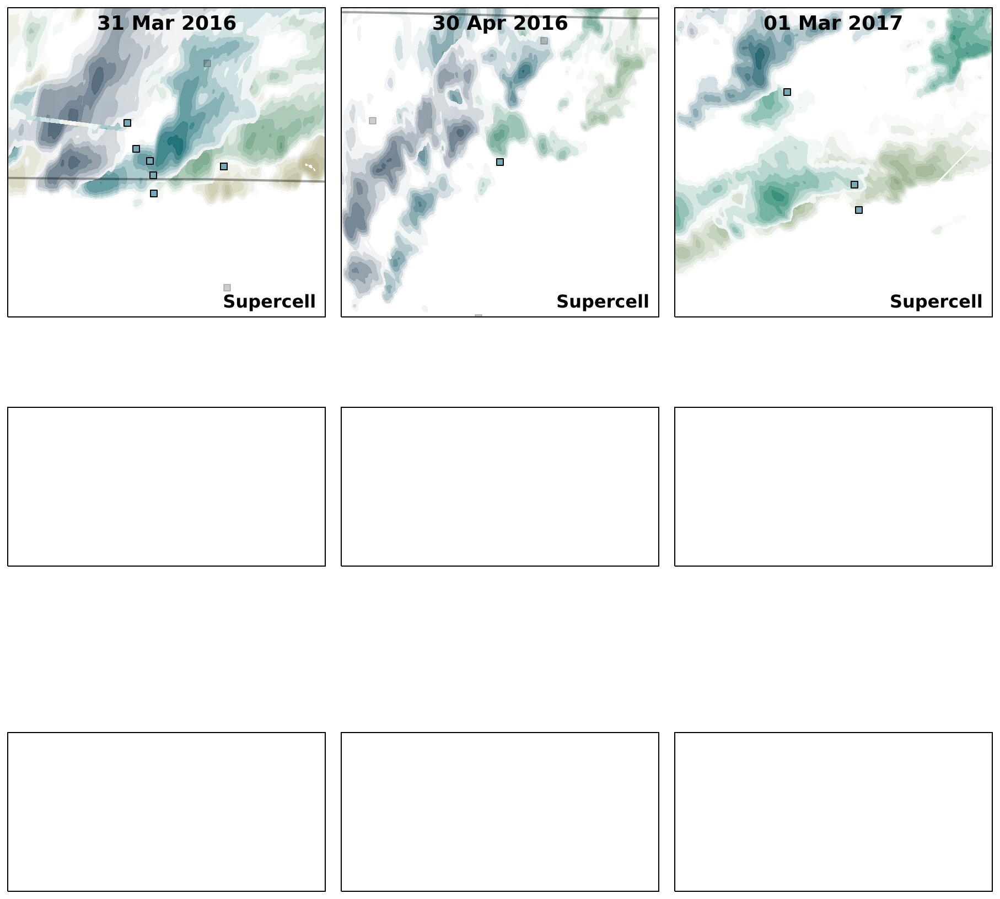

In [59]:
ratio = (north_lat - south_lat)/(west_lon-east_lon)


fig, axes=plt.subplots(3,3, figsize=(16,16), subplot_kw={'projection': crs} )


for e,ax in enumerate(axes.flatten()):
    if e <3:
        ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
        ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
        #ax.add_feature(USCOUNTIES.with_scale('20m'), alpha=0.1, linewidth=0.5) 
        ax.set_aspect('auto')


        # RADAR DATA
        clist = col_dict[events[e]]

        times = time_dict[events[e]]

        for i, time in enumerate(times):
            hour, mins = int(time[0:2]), int(time[2:])
            analysis_time = events[e].replace(hour=hour, minute=mins)
            date = analysis_time.strftime('%Y%m%d')
            HHMM = analysis_time.strftime('%H%M')
            fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

            rdata = pickle.load(open(fname, 'rb'))
            lons, lats, ref = rdata[0], rdata[1], rdata[2]
            #print(np.shape(ref))

            smooth = nd.gaussian_filter(ref, sigma = 1.1)
            newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
            ax.contourf(lons, lats, smooth, levels=np.arange(30,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)



        # TITLE                                              
        ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=18, weight='bold',
                transform=ax.transAxes)



        # plotting sticknets
        if events[e] != dt.datetime(2017,3,1):
            ax.scatter(all_lons, all_lats, marker='s', color='k', alpha=0.2, transform=crs)

        ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
        ev1 = ev[ev['type'] == 'R']
        lons = ev1['Lons']; lats = ev1['Lats']
        ax.scatter(lons, lats, marker='s', color='#74a9b8', transform=crs, label='StickNet', ec='k')

        ev2 = ev[ev['type'] == 'T']
        lons = ev2['Lons']; lats = ev2['Lats']
        ax.scatter(lons, lats, marker='s', color='#b85151', transform=crs, label='StickNet', ec='k')


        # mode
        if ev['mode'].iloc[0] == 'linear':
            mode = 'Linear'
        if ev['mode'].iloc[0] == 'mixed':
            mode = 'Hybrid'
        if ev['mode'].iloc[0] == 'supercell':
            mode = 'Supercell'

        text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
                transform=ax.transAxes)
        text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                           path_effects.Normal()])
        
        
        # add scale bar
        #scale_bar(ax, length=20, location=(0.1,.1), linewidth=12, fontsize=14, text_pad=-20, inner_spacing=10)


        if events[e] == dt.datetime(2016,3,31):
            set_plot_ratio(.4, ev1, ev2, ax, ratio)
        if events[e] == dt.datetime(2016,4,30):
            set_plot_ratio(.4, ev1, ev2, ax, ratio)
        if events[e] == dt.datetime(2017,3,1):
            set_plot_ratio(.5, ev1, ev2, ax, ratio)


plt.subplots_adjust(hspace=0.05, wspace=0.05)

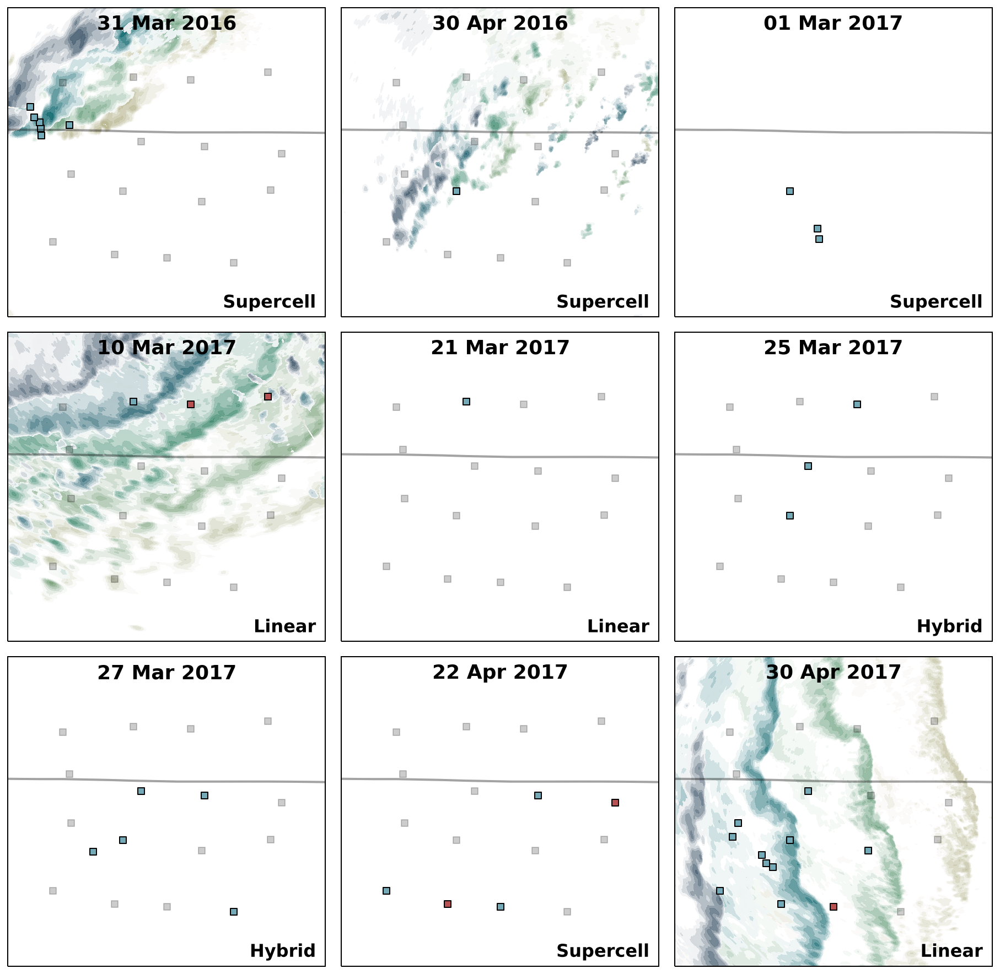

In [42]:
fig, axes=plt.subplots(3,3, figsize=(16,16), subplot_kw={'projection': crs} )


for e,ax in enumerate(axes.flatten()):
    #if e <3:
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    #ax.add_feature(USCOUNTIES.with_scale('20m'), alpha=0.1, linewidth=0.5) 
    ax.set_aspect('auto')


    # RADAR DATA
    clist = col_dict[events[e]]

    times = time_dict[events[e]]

    for i, time in enumerate(times):
        hour, mins = int(time[0:2]), int(time[2:])
        analysis_time = events[e].replace(hour=hour, minute=mins)
        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

        rdata = pickle.load(open(fname, 'rb'))
        lons, lats, ref = rdata[0], rdata[1], rdata[2]
        #print(np.shape(ref))

        smooth = nd.gaussian_filter(ref, sigma = 1.1)
        newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
        ax.contourf(lons, lats, smooth, levels=np.arange(30,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)



    # TITLE                                              
    ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=18, weight='bold',
            transform=ax.transAxes)



    # plotting sticknets
    if events[e] != dt.datetime(2017,3,1):
        ax.scatter(all_lons, all_lats, marker='s', color='k', alpha=0.2, transform=crs)

    ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
    ev1 = ev[ev['type'] == 'R']
    lons = ev1['Lons']; lats = ev1['Lats']
    ax.scatter(lons, lats, marker='s', color='#74a9b8', transform=crs, label='StickNet', ec='k')

    ev2 = ev[ev['type'] == 'T']
    lons = ev2['Lons']; lats = ev2['Lats']
    ax.scatter(lons, lats, marker='s', color='#b85151', transform=crs, label='StickNet', ec='k')


    # mode
    if ev['mode'].iloc[0] == 'linear':
        mode = 'Linear'
    if ev['mode'].iloc[0] == 'mixed':
        mode = 'Hybrid'
    if ev['mode'].iloc[0] == 'supercell':
        mode = 'Supercell'

    text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                       path_effects.Normal()])




plt.subplots_adjust(hspace=0.05, wspace=0.05)

In [5]:
# takes 20 seconds


import shapefile

data2017  = shapefile.Reader(r'/Users/jessmcd/Documents/MyPassport_backup/VortexSE/watch_warning/2017')
shapes2017 = data2017.shapes()

data2016  = shapefile.Reader(r'/Users/jessmcd/Documents/MyPassport_backup/VortexSE/watch_warning/2016')
shapes2016 = data2016.shapes()

wfo_array=['HUN','OHX','BMX','FFC','MRX','MEG']
columns = ['WFO', 'ISSUED', 'EXPIRED', 'PHENOM', 'GTYPE', 'SIG'] 

# prep 2017 dataframe
df = pd.DataFrame(data=[y[:] for y in data2017.records()])
df = df.loc[:, [0,1,2,5,6,7]]
df.columns = columns

rf2017 = df[(df['PHENOM']=='TO') & (df['SIG']=='W') & (df['WFO'].isin(wfo_array)) & (df['GTYPE'] == 'P')] 
rf2017 = rf2017.drop(columns=['PHENOM', 'SIG', 'GTYPE'])
rf2017.loc[:,'ISSUED'] =  pd.to_datetime(rf2017['ISSUED'].copy(), format='%Y%m%d', exact=False)


# prep 2016 dataframe
df = pd.DataFrame(data=[y[:] for y in data2016.records()])
df = df.loc[:, [0,1,2,5,6,7]]
df.columns = columns

rf2016 = df[(df['PHENOM']=='TO') & (df['SIG']=='W') & (df['WFO'].isin(wfo_array))& (df['GTYPE'] == 'P')] 
rf2016 = rf2016.drop(columns=['PHENOM', 'SIG', 'GTYPE'])
rf2016.loc[:,'ISSUED'] =  pd.to_datetime(rf2016['ISSUED'].copy(), format='%Y%m%d', exact=False)


/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


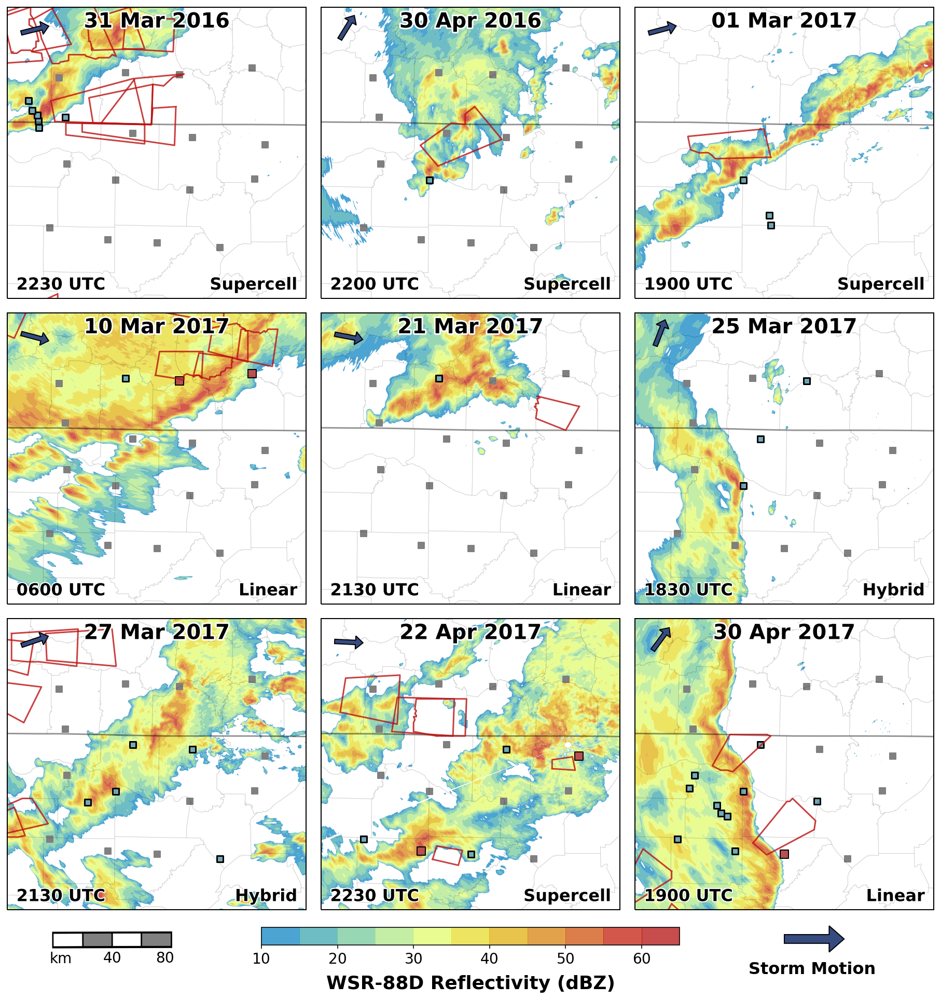

In [11]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

time_dict = {dt.datetime(2016,3,31):['2230'], 
             dt.datetime(2016,4,30):['2200'], 
             dt.datetime(2017,3,1):['1900'],
             dt.datetime(2017,3,10):['0600'], 
             dt.datetime(2017,3,21):['2130'], 
             dt.datetime(2017,3,25):['1830'],
             dt.datetime(2017,3,27):['2130'], 
             dt.datetime(2017,4,22):['2230'], 
             dt.datetime(2017,4,30):['1900']}



fig, axes=plt.subplots(3,3, figsize=(16,16), sharex=True, sharey=True, subplot_kw={'projection': crs} )

for e,ax in enumerate(axes.flatten()):
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=1.5)
    ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1, linewidth=0.5) 
    ax.set_aspect('auto')
    
    # RADAR DATA
    time = time_dict[events[e]][0]

    hour, mins = int(time[0:2]), int(time[2:])
    analysis_time = events[e].replace(hour=hour, minute=mins)
    date = analysis_time.strftime('%Y%m%d')
    HHMM = analysis_time.strftime('%H%M')
    fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

    rdata = pickle.load(open(fname, 'rb'))
    lons, lats, ref = rdata[0], rdata[1], rdata[2]

    smooth = nd.gaussian_filter(ref, sigma = 1.1)
    im = ax.contourf(lons, lats, smooth, levels=np.arange(10,70,5), cmap= 'pyart_HomeyerRainbow', alpha=0.7,
                    antialiased=True)
    
    
    # TITLE                                              
    text = ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=20, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=3, foreground='white'),
                       path_effects.Normal()])
    
    
    if events[e].strftime('%Y') == '2016':
        keep = rf2016[rf2016['ISSUED'] == events[e]]
        keepids = list(keep.index)
        poly = [shapes2016[i].points for i in keepids]
    else:
        keep = rf2017[rf2017['ISSUED'] == events[e]]
        keepids = list(keep.index)
        poly = [shapes2017[i].points for i in keepids]
    plot_warnings(poly, ax, linewidth = 1.5,alpha=0.8, color='#bc1010',label = 'Tornado Warning')
    
    
    
    # plotting sticknets
    if events[e] != dt.datetime(2017,3,1):
        ax.scatter(all_lons, all_lats, marker='s', color='#808080', transform=crs)

    ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
    
    ev1 = ev[ev['type'] == 'R']
    lons = ev1['Lons']; lats = ev1['Lats']
    ax.scatter(lons, lats, marker='s', color='#74a9b8', s=(6**2),transform=crs, label='StickNet', ec='k', 
               linewidth=1.5)
    
    ev2 = ev[ev['type'] == 'T']
    lons = ev2['Lons']; lats = ev2['Lats']
    ax.scatter(lons, lats, marker='s', color='#b85151', s=(8**2),transform=crs, label='StickNet', ec='k')
             
             
    # arrow        
    Ua = np.nanmean(ev['Ua']); Va = np.nanmean(ev['Va'])
    angle=np.arctan2(Va, Ua); r = 0.07
    dy = r*np.sin(angle) ; dx = r*np.cos(angle)
    Y = .92 - (dy/2)
    X = .08  - (dx/2)
    ax.arrow(X, Y, dx, dy,transform=ax.transAxes,
                width=.015, head_length=.025, facecolor='#364c80', edgecolor='k', zorder=31)

    # time
    text = ax.text(0.03, .03, analysis_time.strftime('%H%M UTC'), ha='left', fontsize=16, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                       path_effects.Normal()])
    
    # mode
    if ev['mode'].iloc[0] == 'linear':
        mode = 'Linear'
    if ev['mode'].iloc[0] == 'mixed':
        mode = 'Hybrid'
    if ev['mode'].iloc[0] == 'supercell':
        mode = 'Supercell'
     
    text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                       path_effects.Normal()])


plt.subplots_adjust(hspace=0.05, wspace=0.05)


  # adds larger title and gives stylistic control over colorbar
norm = plt.Normalize(vmin=10, vmax=70)
ax2 = axes[2,1].inset_axes([-.2, -0.12, 1.4, 0.06]) 
cbar2 = plt.colorbar(im,pad=0.02, cax=ax2,orientation='horizontal')
cbar2.set_label('WSR-88D Reflectivity (dBZ)', fontsize = 18, labelpad = 8, weight='bold')
cbar2.ax.tick_params(labelsize = 14)


# add scale bar
scale_bar(axes[2,0], length=80, location=(0.35, -.105), linewidth=12, fontsize=14, text_pad=-20, inner_spacing=10)

# add arrow and text
angle=np.arctan2(Va, Ua); r = 0.07
dy = r*np.sin(angle) ; dx = r*np.cos(angle)
Y = .92 - (dy/2)
X = .08  - (dx/2)
axes[2,2].arrow(0.5, -0.1, .15, 0,transform=ax.transAxes,
            width=.015*2, head_length=.025*2, facecolor='#364c80', edgecolor='k', clip_on=False);
axes[2,2].text(0.38, -0.22, 'Storm Motion',transform=ax.transAxes, weight='bold', fontsize=16);

file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/PubPlots/'
plt.savefig('{0}AllEventOverviewNEW.png'.format(file_dir), bbox_inches = 'tight', format='png', dpi=300);

In [77]:
probe_locs

{'0102A': [34.2959, -87.5871, 282, 'SHYL', 'Haleyville'],
 '0103A': [34.8551, -86.0017, 513, 'SCMT', 'Crow Mnt'],
 '0104A': [35.3391, -87.0324, 239, 'SLYN', 'Lynnville'],
 '0105A': [34.6224, -86.08, 182, 'SSBR', 'Scottsboro'],
 '0106A': [34.2149, -87.1619, 245, 'SADN', 'Addison'],
 '0107A': [34.19439, -86.79825, 231, 'SCLM', 'Cullman'],
 '0108A': [35.3236, -86.6347, 230, 'SPBG', 'Petersburg'],
 '0109A': [35.3045, -87.5185, 315, 'SLBG', 'Lawrenceburg'],
 '0110A': [34.1632, -86.3341, 280, 'SDGS', 'Douglas'],
 '0111A': [34.5504, -86.5582, 174, 'SLYS', 'Laceys Springs'],
 '0112A': [34.7254, -87.4625, 174, 'SLGN', 'Leighton'],
 '0213A': [34.9016, -86.5386, 239, 'SHLG', 'Hazel Green'],
 '0214A': [34.9309, -86.9764, 256, 'SEMT', 'Elkmont'],
 '0215A': [35.038, -87.4719, 237, 'SSJH', 'Saint Joseph'],
 '0216A': [35.3719, -86.0998, 305, 'STLM', 'Tullahoma'],
 '0217A': [34.6176, -87.1014, 192, 'SDTR', 'Decatur']}